# My first messy work-in-progress notebook to work with NIHPD objective 2 data and BrainBox to analyse longitudinal data for brain anatomy development

## The Data
The National Institute of Health Pediatric Data Repository is a multi-center project to further our understanding of healthy, normal brain development. <br>
NIHPD objectif 2 contains longitudinal pediatric neuroimaging data for a cohort of children aged 0 to 4.5 years. Each individual has been scanned up to ten times (and, on average, 7 time points are available: birth, ~3 months, ~6 months, 1 year?...), intervals range from 3 months to 1 year (N = 116). <br>
T1 weighted, T2 weighted and Proton Density images have been acquired for xxx children. For our analyses, we used the T2 weighted images for the 17 children who had data for at least 5 time points. These comprise in total 114 T2 weighted scanse from 9 female and 8 male subjects. (1437F
1460F
1468F
1472M
1484M
1502F
1507F
1508F
1510M
1515M
1525M
1528M
1531F
1543F
1548F
1553M
1555M) <br>
at V1: 419 kids have been scanned;<br>
at V2: 399;<br>
at V3: 277;<br>
at V4: 35;<br>
at V5: 21;<br>
at V6: 17;<br>
at V7: 14;<br>
at V8: 6;<br>
V9: 2;<br>
V10: 1. <br>
They also acquired DTI and proton MR spectroscopy data. <br>
Behavioral measurements: <br> 
Tests: Bayley Scales of Infant Development, California Verbal Learning, CANTAB, Differential Ability Scales, Handedness, Verbal fluency, Preschool Language Scales-3, Purdue Pegboard, Wechsler Digit span, Digit symbol and Coding, Wechsler Abbreviated Scale of Intelligence (WASI), Woodcock-Johnson Tests of Achievement-III



## Steps
#### Data conversion
from minc --> analyze format (with stereotaxic) --> nii.gz via fslchfiletype_exe NIFTI_GZ

#### Segmentations
**ICV** <br>
We first manually segmented the intracranial volume in all images. We used StereotaxicRAMON (https://github.com/r03ert0/StereotaxicRAMON) to do the segmentation of the intracranial volume. Everytime an image is loaded again and voxels are added to the segmentation, they will have a new value, different from the previously drawn mask voxels. Therefore, it will be necessary to binarize these ICV masks (once downloaded from BrainBox-ICV). <br>
**Cerebellum and Cerebrum** <br>
Since manual segmentation is very time consuming, we created a tool which allows real-time interactive collaboration on brain images: BrainBox (http://brainbox.pasteur.fr/). We set up an NIHPD project on BrainBox, and manually created another segmentation for each subject and each time point delineating the cerebellum, cerebrum and brain stem separately. <br>
We then downloaded these manual segementations, and calculated a mode segmentation file from them which we registered onto all our subjects to see if we can avoid manual segmentation to a certain extent – but it was impossible. The mode segmentations could be a rough guide for us in some cases, but we mostly drew the segmentations manually again.


A combination of automatic and manual segmentation was used to generate masks delineating the cerebrum and the cerebellum for each subject at each time point. 
<br>
<br>
<br>
<br>

#### just a note for me regarding my folders:
**working dir:** /Users/katja/NIHPD/ <br> 

ANATOMICAL DATA: <br>
**T2w** contains raw anatomical data from Dropbox (downloaded from NIHPD --> converted from minc --> vramon --> nii.gz). BrainBox at that time we started the project had an issue reading the matrix correctly and displaying the data accordingly. (It showed the images squeezed in z-direction.) <br>
**NIHPD_longitudinal** contains "fixed" anat data :) (passed through FSL doing its magic trick writing a correct header...) <br>
**T2w_withSeg** contains the anatomical data sets that have been manually segmented in first place <br>
**regAnatSegTo1437_V3** contains all anat scans registered onto 1437_V3 using 3 iterations in each transformation <br> 
&nbsp;&nbsp;&nbsp;&nbsp;(we chose 1437_V3 as a reference because it was straight, and the scan was of good quality; <br>
&nbsp;&nbsp;&nbsp;&nbsp;however, the contrast between GM and WM is not that striking yet since it is an early time point in development and myelination is not yet very advanced.... <br>
&nbsp;&nbsp;&nbsp;&nbsp;maybe this is why registrations were not thaaaat perfect and I ended up manually segmenting all the brains... <br>
**regAnatSegTo1437_V3_evenLess** contains all anatomical scans registered onto 1437_V3 using 2 iterations in each transformation. The generated transformation matrices of this step have later been used to register the generated mode-segmentation file onto each anatomical scan. <br>

SEGMENTATIONS: <br>
**segmentationsBB** contains all Cerebellum segmentations as downloaded from BrainBox with the matrix issue <br>
**segCerebellum** contains the fixed segmentations (header written by FSL) <br> 
**regSegCbTo1437_V3** contains all segmentations warped onto 1437_V3
<br>
<br>
<br>
<br>

In [9]:
%pylab inline

Populating the interactive namespace from numpy and matplotlib


## 1    Imports

In [6]:
import urllib2 as url
import re
import os
import numpy as np
import pandas as pd
import scipy as sp
from scipy import stats
import statsmodels.api as sm
import statsmodels.formula.api as smf
import statsmodels.stats.power as smp
import matplotlib.pyplot as plt
from StringIO import StringIO
import json

# Install seaborn typing `conda install seaborn`
import seaborn as sns

# Install nilearn and nibabel typing `pip install nilearn`
import nibabel as nib
import nilearn
from nilearn import plotting
from nilearn.plotting import plot_roi, show
from nilearn.image import load_img, new_img_like, math_img
from nilearn.image import concat_imgs

## 2    Load MRI (from disc), plot MRI, set its sform, save

In [2]:
# raw anatomy data
rdir = '/Users/katja/NIHPD/NIHPD_longitudinal/'
subjects = ['1437_V1_f.nii.gz', '1437_V2_f.nii.gz', '1437_V3_f.nii.gz', '1437_V4_f.nii.gz', '1437_V5_f.nii.gz', '1460_V1_f.nii.gz', '1460_V2_f.nii.gz', '1460_V3_f.nii.gz', '1460_V4_f.nii.gz', '1460_V5_f.nii.gz', '1460_V6_f.nii.gz', '1460_V7_f.nii.gz', '1460_V8_f.nii.gz', '1460_V9_f.nii.gz', '1468_V10_f.nii.gz', '1468_V3_f.nii.gz', '1468_V4_f.nii.gz', '1468_V5_f.nii.gz', '1468_V6_f.nii.gz', '1468_V7_f.nii.gz', '1468_V8_f.nii.gz', '1468_V9_f.nii.gz', '1472_V1_f.nii.gz', '1472_V2_f.nii.gz', '1472_V3_f.nii.gz', '1472_V4_f.nii.gz', '1472_V6_f.nii.gz', '1472_V7_f.nii.gz', '1484_V1_f.nii.gz', '1484_V3_f.nii.gz', '1484_V4_f.nii.gz', '1484_V5_f.nii.gz', '1484_V6_f.nii.gz', '1484_V7_f.nii.gz', '1484_V8_f.nii.gz', '1502_V1_f.nii.gz', '1502_V2_f.nii.gz', '1502_V3_f.nii.gz', '1502_V4_f.nii.gz', '1502_V5_f.nii.gz', '1502_V6_f.nii.gz', '1502_V7_f.nii.gz', '1507_V1_f.nii.gz', '1507_V2_f.nii.gz', '1507_V3_f.nii.gz', '1507_V4_f.nii.gz', '1507_V5_f.nii.gz', '1508_V1_f.nii.gz', '1508_V2_f.nii.gz', '1508_V3_f.nii.gz', '1508_V4_f.nii.gz', '1508_V5_f.nii.gz', '1508_V6_f.nii.gz', '1508_V7_f.nii.gz', '1508_V8_f.nii.gz', '1510_V1_f.nii.gz', '1510_V2_f.nii.gz', '1510_V3_f.nii.gz', '1510_V4_f.nii.gz', '1510_V5_f.nii.gz', '1510_V6_f.nii.gz', '1510_V7_f.nii.gz', '1510_V8_f.nii.gz', '1515_V1_f.nii.gz', '1515_V2_f.nii.gz', '1515_V3_f.nii.gz', '1515_V4_f.nii.gz', '1515_V5_f.nii.gz', '1515_V6_f.nii.gz', '1515_V7_f.nii.gz', '1525_V1_f.nii.gz', '1525_V2_f.nii.gz', '1525_V3_f.nii.gz', '1525_V4_f.nii.gz', '1525_V5_f.nii.gz', '1525_V6_f.nii.gz', '1528_V1_f.nii.gz', '1528_V2_f.nii.gz', '1528_V3_f.nii.gz', '1528_V4_f.nii.gz', '1528_V5_f.nii.gz', '1528_V7_f.nii.gz', '1531_V1_f.nii.gz', '1531_V2_f.nii.gz', '1531_V3_f.nii.gz', '1531_V4_f.nii.gz', '1531_V5_f.nii.gz', '1543_V1_f.nii.gz', '1543_V2_f.nii.gz', '1543_V4_f.nii.gz', '1543_V5_f.nii.gz', '1543_V6_f.nii.gz', '1548_V1_f.nii.gz', '1548_V2_f.nii.gz', '1548_V3_f.nii.gz', '1548_V4_f.nii.gz', '1548_V5_f.nii.gz', '1548_V6_f.nii.gz', '1548_V7_f.nii.gz', '1553_V1_f.nii.gz', '1553_V2_f.nii.gz', '1553_V3_f.nii.gz', '1553_V4_f.nii.gz', '1553_V5_f.nii.gz', '1553_V6_f.nii.gz', '1553_V7_f.nii.gz', '1555_V1_f.nii.gz', '1555_V2_f.nii.gz', '1555_V3_f.nii.gz', '1555_V4_f.nii.gz', '1555_V5_f.nii.gz', '1555_V6_f.nii.gz', '1555_V7_f.nii.gz', '1555_V8_f.nii.gz']
# anatomy data with correct sform
T2w = '/Users/katja/NIHPD/T2w/'


/Users/katja/NIHPD/data/raw-data/t2w/sub-1437_ses-V1_T2w.nii.gz


/Users/katja/anaconda/lib/python2.7/site-packages/matplotlib/cbook.py:136: MatplotlibDeprecationWarning: The axisbg attribute was deprecated in version 2.0. Use facecolor instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1437_ses-V2_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1437_ses-V3_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1437_ses-V4_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1437_ses-V5_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -75. ]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1460_ses-V1_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -

/Users/katja/anaconda/lib/python2.7/site-packages/matplotlib/pyplot.py:524: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1468_ses-V9_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1472_ses-V1_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1472_ses-V2_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1472_ses-V3_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
/Users/katja/NIHPD/data/raw-data/t2w/sub-1472_ses-V4_T2w.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -

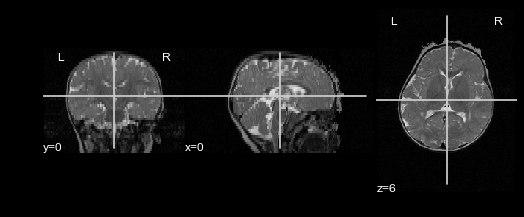

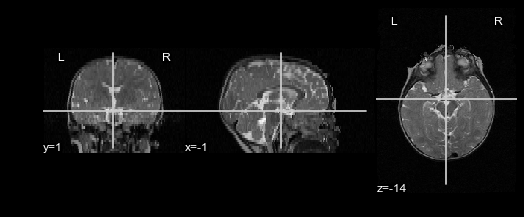

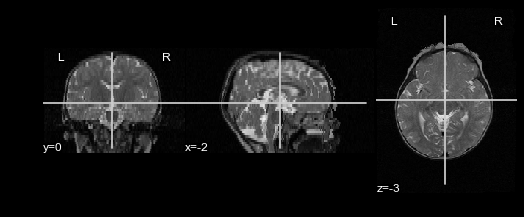

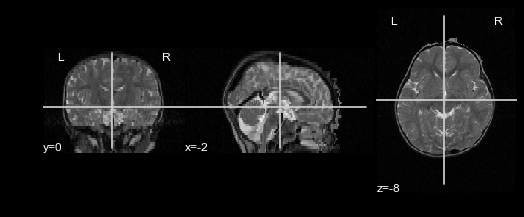

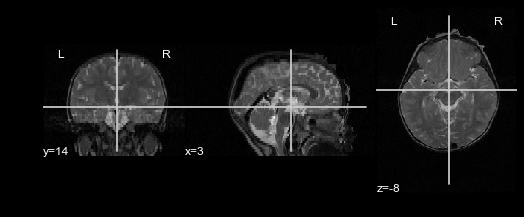

...

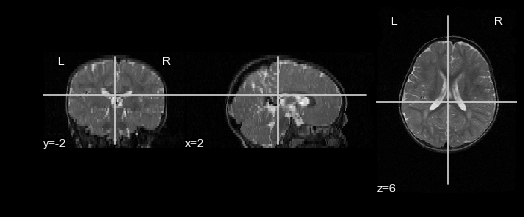

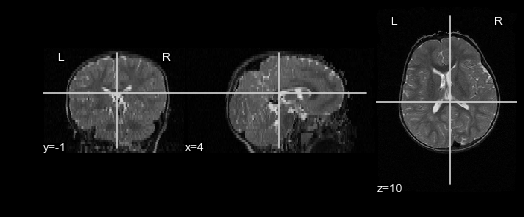

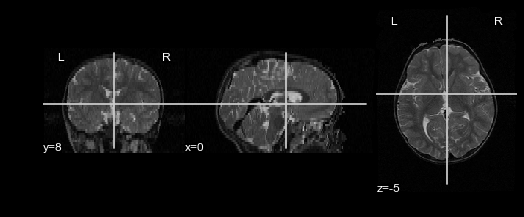

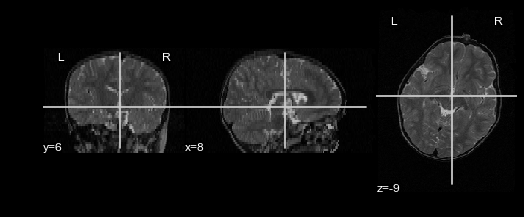

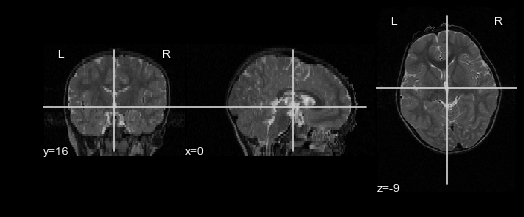

In [16]:
for sub in subjects:
    path = "{dir}{sub}".format( dir=rdir, sub=sub )
    print( path )
    img = nib.load( path )
    max = img.get_data().max()
    plotting.plot_anat( img, vmax=max )
    affine = img.affine
    print( affine )
    hdr = img.header
    hdr.set_sform( affine )
    raw = hdr.structarr
    raw['sform_code'] = 1
    a = sub.split("_")
    nib.nifti1.save( img, T2w+a[0]+'_'+a[1]+'.nii.gz' )
    
    

# 3 Download segmentations from BrainBox

In [3]:
# get token by going to logging into brainbox at brainbox.pasteur.fr and then going to http://brainbox.pasteur.fr/mri/upload
# token valid for 24h
token = "vh75ydo7qond0a4i3nh5fqhscz8e61or"

# Get data from the NIHPD Project
prj_url = "http://brainbox.pasteur.fr/project/json/nihpd2?token="+token
res = url.urlopen( prj_url )
txt = res.read()
prj = json.loads( txt )
nfiles = len( prj['files']['list'] )

N = nfiles

In [5]:
# Get individual mri annotations
# run this twice: once downloading all annotations called 'Cerebellum' and once downloading all called 'ICV'
for isub in range( 0,N ):
    bb_url = "http://brainbox.pasteur.fr/mri/json?url="+prj['files']['list'][isub]+"&token="+token
    res = url.urlopen( bb_url )
    txt = res.read()
    mri = json.loads( txt) 
    
    # Search for specific atlases within the annotations
    natlases = len(mri['mri']['atlas'])
    base = "http://brainbox.pasteur.fr"+mri['url']
    index = -1
    for i in range( 0, natlases ):
        if 'name' in mri['mri']['atlas'][i] and mri['mri']['atlas'][i]['name'] == 'Cerebellum':
            index = i
            filename = mri['mri']['atlas'][i]['filename']
            print str( isub )+". [" + str( index ) + "] " + base + filename
            break
    if index < 0:
        continue

    # Load atlas
    atlas_url = base + filename
    # print atlas_url
    try:
        f = url.urlopen( atlas_url )
        local_file = open( mri['name']+'_Cerebellum.nii.gz', "wb" )
        local_file.write( f.read() )
        local_file.close()
    except:
        print "File does not exist"


0. [2] http://brainbox.pasteur.fr/data/4b77d5559a07039b6bcb0599a597bd8b/ptsghioonj9y03349fanyiudi.nii.gz
1. [2] http://brainbox.pasteur.fr/data/eb8e858a27aec14b7a94aa365d2a6241/umdzwt8cm84rarglv2pousor.nii.gz
2. [2] http://brainbox.pasteur.fr/data/023d70620b2918f89dbcab2041b1d424/wlf568guzns5ze6u2i34hd7vi.nii.gz
3. [2] http://brainbox.pasteur.fr/data/b7336eb0610bb2ab263ae993b5107027/ui3k7gf8lhj7uu2h7w0icnmi.nii.gz
4. [2] http://brainbox.pasteur.fr/data/b18c18bbba4545ae0ac7e0b31d6e637b/2pled075wosb8fdbz5ambfn7b9.nii.gz
5. [2] http://brainbox.pasteur.fr/data/18253d3203ba3406c98195ec24a923c2/azrphtp8ee2w7ywdval15rk9.nii.gz
6. [2] http://brainbox.pasteur.fr/data/6f2de6730252eb3455b8e35722ba322a/bers3nxkfy84zpbe9babp4x6r.nii.gz
7. [2] http://brainbox.pasteur.fr/data/5e54b02195b32d2e8c8f11a0cffc8762/dku0iz3os01npx1zncbwc23xr.nii.gz
File does not exist
8. [2] http://brainbox.pasteur.fr/data/55c6d61340b1d68a8e5a360b1cb2634a/8ixyad4kpboyxelz1fhguv7vi.nii.gz
File does not exist
9. [2] http://bra

In [36]:
# mri['name']

In [ ]:
%%bash
# move all downloaded segmentations into new folder (#44)
cd /Users/katja/code/notebooks
mkdir segmentations3
mv 1* /segmentations3

In [6]:
%%bash
cd /Users/katja/code/notebooks/segmentations3
ls 1* > segmentations.txt
cat /Users/katja/code/notebooks/segmentations3/segmentations.txt|while read r;do cp $r /Users/katja/NIHPD/segmentationsBB/;done


In [7]:
%%bash
cd /Users/katja/NIHPD
mkdir segCerebellum
cd /Users/katja/NIHPD/segmentationsBB 
ls 1* > subjects.txt

# open in textWrangler --> find ^(.*)$ and replace by '\1' 
#                          find \r and replace by (space) --> copy this into your bash subjects=() (next cell)
#                      --> find \r and replace by , (comma space) --> copy this into your python subjects = [] 


# 4    Load segmentations, plot them, set sform, save

In [9]:
%%bash
#pass segmentations downloaded from BrainBox through fsl to make them readable by nilearn
#subjects=('1437_V1_Cerebellum.nii.gz')
cd /Users/katja/NIHPD/segmentationsBB/
subjects=('1437_V1_Cerebellum.nii.gz' '1437_V2_Cerebellum.nii.gz' '1437_V3_Cerebellum.nii.gz' '1437_V4_Cerebellum.nii.gz' '1437_V5_Cerebellum.nii.gz' '1460_V1_Cerebellum.nii.gz' '1460_V2_Cerebellum.nii.gz' '1460_V3_ICV.nii.gz' '1460_V4_ICV.nii.gz' '1460_V5_ICV.nii.gz' '1460_V6_ICV.nii.gz' '1460_V7_ICV.nii.gz' '1460_V8_ICV.nii.gz' '1460_V9_ICV.nii.gz' '1468_V10_ICV.nii.gz' '1468_V3_ICV.nii.gz' '1468_V4_ICV.nii.gz' '1468_V5_ICV.nii.gz' '1468_V6_ICV.nii.gz' '1468_V7_ICV.nii.gz' '1468_V8_ICV.nii.gz' '1468_V9_ICV.nii.gz' '1472_V1_ICV.nii.gz' '1472_V2_ICV.nii.gz' '1472_V3_ICV.nii.gz' '1472_V6_Cerebellum.nii.gz' '1472_V7_Cerebellum.nii.gz' '1484_V1_ICV.nii.gz' '1553_V1_Cerebellum.nii.gz' '1553_V2_Cerebellum.nii.gz' '1553_V3_Cerebellum.nii.gz' '1553_V4_Cerebellum.nii.gz' '1553_V5_Cerebellum.nii.gz' '1553_V6_Cerebellum.nii.gz' '1553_V7_Cerebellum.nii.gz' '1555_V1_Cerebellum.nii.gz' '1555_V2_Cerebellum.nii.gz' '1555_V3_Cerebellum.nii.gz' '1555_V4_ICV.nii.gz' '1555_V5_ICV.nii.gz' '1555_V6_ICV.nii.gz' '1555_V7_Cerebellum.nii.gz' '1555_V8_Cerebellum.nii.gz')
for i in ${subjects[@]}; do fslchfiletype NIFTI_GZ /Users/katja/NIHPD/segmentationsBB/${i};done

In [10]:
#raw segmentation data
sdir = '/Users/katja/NIHPD/segmentationsBB/'
subjects = ['1437_V1_Cerebellum.nii.gz', '1437_V2_Cerebellum.nii.gz', '1437_V3_Cerebellum.nii.gz', '1437_V4_Cerebellum.nii.gz', '1437_V5_Cerebellum.nii.gz', '1460_V1_Cerebellum.nii.gz', '1460_V2_Cerebellum.nii.gz', '1460_V3_ICV.nii.gz', '1460_V4_ICV.nii.gz', '1460_V5_ICV.nii.gz', '1460_V6_ICV.nii.gz', '1460_V7_ICV.nii.gz', '1460_V8_ICV.nii.gz', '1460_V9_ICV.nii.gz', '1468_V10_ICV.nii.gz', '1468_V3_ICV.nii.gz', '1468_V4_ICV.nii.gz', '1468_V5_ICV.nii.gz', '1468_V6_ICV.nii.gz', '1468_V7_ICV.nii.gz', '1468_V8_ICV.nii.gz', '1468_V9_ICV.nii.gz', '1472_V1_ICV.nii.gz', '1472_V2_ICV.nii.gz', '1472_V3_ICV.nii.gz', '1472_V6_Cerebellum.nii.gz', '1472_V7_Cerebellum.nii.gz', '1484_V1_ICV.nii.gz', '1553_V1_Cerebellum.nii.gz', '1553_V2_Cerebellum.nii.gz', '1553_V3_Cerebellum.nii.gz', '1553_V4_Cerebellum.nii.gz', '1553_V5_Cerebellum.nii.gz', '1553_V6_Cerebellum.nii.gz', '1553_V7_Cerebellum.nii.gz', '1555_V1_Cerebellum.nii.gz', '1555_V2_Cerebellum.nii.gz', '1555_V3_Cerebellum.nii.gz', '1555_V4_ICV.nii.gz', '1555_V5_ICV.nii.gz', '1555_V6_ICV.nii.gz', '1555_V7_Cerebellum.nii.gz', '1555_V8_Cerebellum.nii.gz']
#subjects = ['1437_V1_Cerebellum.nii.gz']
# segmentations with correct sform
segCb = '/Users/katja/NIHPD/segCerebellum/'
#mask = nib.load('/Users/katja/NIHPD/segmentations/1437_V1_Cerebellum.nii.gz')

In [11]:
for sub in subjects:
    path = "{dir}{sub}".format( dir=sdir, sub=sub )
    print( path )
    seg = nib.load( path )
    # plotting doesn't work for so many images
    # max = seg.get_data().max()
    # plotting.plot_anat( seg, vmax=max )
    affine = seg.affine
    print( affine )
    hdr = seg.header
    hdr.set_sform( affine )
    raw = hdr.structarr
    raw['sform_code'] = 1
    print hdr
    #nib.nifti1.save( seg, segCb+sub )
    a=sub.split("_")
    #print a 
    nib.nifti1.save( seg, segCb+a[0]+'_'+a[1]+'_Cerebellum.nii.gz' )
   
    
    
    
    

/Users/katja/NIHPD/segmentationsBB/1437_V1_Cerebellum.nii.gz
[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  48   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : uint8
bitpix          : 8
slice_start     : 0
pixdim          : [ 1.  1.  1.  3.  0.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : FSL5.0
aux_file        : 1r2r3r4r5r6r7r8r9r:r;r<
qform_code      : unknown
sform_

# 5    register the anatomical images to one anatomical image

by choice: to 1437_V3 or 1437_V5 (quite straight :), quite good quality
Now in retrospective, it might have been better to try to segment the oldest time point per subject, and try to backpropagate. With the current method, the brain is often assumed too small so I had not only to redraw the inner outlines of cerebellum and brain stem but also add a lot of tissue back to the brain mask, especially in frontal and occipital regions in older time points....

%%bash
#here first try with two brains
#with less precision here (not going down to the voxel level) but only using 3 iterations, skipping the last one
#the matrices output here will be used for our segmentations to be moved (they are slightly better)
#template is the one that will be moved!
data=/Users/katja/NIHPD/
sub=1437_V3
template=/Users/katja/NIHPD/T2w/1437_V1.nii.gz
t1brain=/Users/katja/NIHPD/T2w/1437_V3.nii.gz
/Applications/ants/bin/antsRegistration \
    --dimensionality 3 \
    --float 1 \
    --output [$data/regSegCbTo1437_V3/1437_V1_to_${sub},$data/regSegCbTo1437_V3/1437_V1_to${sub}_Warped.nii.gz] \
    --interpolation Linear \
    --winsorize-image-intensities [0.005,0.995] \
    --use-histogram-matching 1 \
    --initial-moving-transform [$t1brain,$template,1] \
    --transform Rigid[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform Affine[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform SyN[0.1,3,0] \
    --metric CC[$t1brain,$template,1,4] \
    --convergence [100x70x50,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox


### next time I might want to try this before on the very tilted images where things quite don t seem to work

In [2]:
%%bash
#antsAffineInitializer ,ImageDimension <ReferenceImage.ext> <movingImage.ext> TransformOutput.mat Optional-SearchFactor Optional-Radian-Fraction Optional-bool-UsePrincipalAxes Optional-uint-UseLocalSearch Optional-Image1Mask/
#DESCRIPTION
#Optional-SearchFactor is in degrees --- e.g. 10 = search in 10 degree increments . Radian-Fraction should be between 0 and 1 --- will search this arc +/- around principal axis. Optional-bool-UsePrincipalAxes determines whether the rotation is searched around an initial principal axis alignment. Default = false. Optional-uint-UseLocalSearch determines if a local optimization is run at each search point for the set number of iterations. Default = 20.

/Applications/ants/bin/antsAffineinItializer \
    3 \                                                                     #image dimensions
    /Users/katja/NIHPD/T2w/1437_V3.nii.gz \                                 #reference image
    /Users/katja/NIHPD/T2w/1460_V1.nii.gz \                                 #moving image
    /Users/katja/NIHPD/regAnatSegTo1437_V3_Try1460twisted/1460_V1.mat \     #transformOutput.mat
    10 \                                                                    #Search Factor in degrees --> degree increments
    0.5 \                                                                   #Radian-Fraction between 0 and 1 --> will search this arc +/- around principal axis. 
    1 \                                                                     #bool-UsePrincipalAxes determines whether the rotation is searched around an initial principal axis alignment
    20                                                                      #uint-UseLocalSearch determines if a local optimization is run at each search point for the set number of iterations. Default = 20.
    

bash: line 6: 58742 Segmentation fault: 11  /Applications/ants/bin/antsAffineinItializer 3 \ 
bash: line 7: /Users/katja/NIHPD/T2w/1437_V3.nii.gz: Permission denied
bash: line 8: /Users/katja/NIHPD/T2w/1460_V1.nii.gz: Permission denied
bash: line 9: /Users/katja/NIHPD/regAnatSegTo1437_V3_Try1460twisted/1460_V1.mat: No such file or directory
bash: line 10: 10: command not found
bash: line 11: 0.5: command not found
bash: line 12: 1: command not found
bash: line 13: 20: command not found


In [12]:
%%bash
# copy anatomical images which we have segmentations of into new folder
cd /Users/katja/NIHPD/segCerebellum
ls 1* > subjectsSegCb.txt 
# open in textWrangler --> put '' and only space in between subjects

In [96]:
%%bash
#subjectsSegCb=('1437_V1_Cerebellum.nii.gz')
cd /Users/katja/NIHPD/T2w/
subjects=('1437_V1.nii.gz' '1437_V2.nii.gz' '1437_V3.nii.gz' '1437_V4.nii.gz' '1437_V5.nii.gz' '1460_V1.nii.gz' '1460_V2.nii.gz' '1460_V3.nii.gz' '1460_V4.nii.gz' '1460_V5.nii.gz' '1460_V6.nii.gz' '1460_V7.nii.gz' '1460_V8.nii.gz' '1460_V9.nii.gz' '1468_V10.nii.gz' '1468_V3.nii.gz' '1468_V4.nii.gz' '1468_V5.nii.gz' '1468_V6.nii.gz' '1468_V7.nii.gz' '1468_V8.nii.gz' '1468_V9.nii.gz' '1472_V1.nii.gz' '1472_V2.nii.gz' '1472_V3.nii.gz' '1472_V6.nii.gz' '1472_V7.nii.gz' '1484_V1.nii.gz' '1553_V1.nii.gz' '1553_V2.nii.gz' '1553_V3.nii.gz' '1553_V4.nii.gz' '1553_V5.nii.gz' '1553_V6.nii.gz' '1553_V7.nii.gz' '1555_V1.nii.gz' '1555_V2.nii.gz' '1555_V3.nii.gz' '1555_V4.nii.gz' '1555_V5.nii.gz' '1555_V6.nii.gz' '1555_V7.nii.gz' '1555_V8.nii.gz')
for i in ${subjects[@]}; do cp ${i} /Users/katja/NIHPD/T2w_withSeg/${i};done

In [9]:
%%bash
# with less precision here (not going down to the voxel level but using 3 iterations only) 
# results better than with 2 iterations only, so this one!
# --> for two subjects : Total elapsed time: 8.7289e+02
# template is the one that will be moved!
data=/Users/katja/NIHPD
sub=1437_V3
# first: done it with the subjects with segmentations
#subjects=('1437_V4.nii.gz' '1437_V5.nii.gz')
#subjects=('1437_V3.nii.gz' '1460_V1.nii.gz' '1460_V2.nii.gz' '1460_V3.nii.gz' '1460_V4.nii.gz' '1460_V5.nii.gz' '1460_V6.nii.gz' '1460_V7.nii.gz' '1460_V8.nii.gz' '1460_V9.nii.gz' '1468_V10.nii.gz' '1468_V3.nii.gz' '1468_V4.nii.gz' '1468_V5.nii.gz' '1468_V6.nii.gz' '1468_V7.nii.gz' '1468_V8.nii.gz' '1468_V9.nii.gz' '1472_V1.nii.gz' '1472_V2.nii.gz' '1472_V3.nii.gz' '1472_V6.nii.gz' '1472_V7.nii.gz' '1484_V1.nii.gz' '1553_V1.nii.gz' '1553_V2.nii.gz' '1553_V3.nii.gz' '1553_V4.nii.gz' '1553_V5.nii.gz' '1553_V6.nii.gz' '1553_V7.nii.gz' '1555_V1.nii.gz' '1555_V2.nii.gz' '1555_V3.nii.gz' '1555_V4.nii.gz' '1555_V5.nii.gz' '1555_V6.nii.gz' '1555_V7.nii.gz' '1555_V8.nii.gz')
#subjects=('1437_V1.nii.gz' '1437_V2.nii.gz' '1437_V3.nii.gz' '1437_V4.nii.gz' '1437_V5.nii.gz' '1460_V1.nii.gz' '1460_V2.nii.gz' '1460_V3.nii.gz' '1460_V4.nii.gz' '1460_V5.nii.gz' '1460_V6.nii.gz' '1460_V7.nii.gz' '1460_V8.nii.gz' '1460_V9.nii.gz' '1468_V10.nii.gz' '1468_V3.nii.gz' '1468_V4.nii.gz' '1468_V5.nii.gz' '1468_V6.nii.gz' '1468_V7.nii.gz' '1468_V8.nii.gz' '1468_V9.nii.gz' '1472_V1.nii.gz' '1472_V2.nii.gz' '1472_V3.nii.gz' '1472_V6.nii.gz' '1472_V7.nii.gz' '1484_V1.nii.gz' '1553_V1.nii.gz' '1553_V2.nii.gz' '1553_V3.nii.gz' '1553_V4.nii.gz' '1553_V5.nii.gz' '1553_V6.nii.gz' '1553_V7.nii.gz' '1555_V1.nii.gz' '1555_V2.nii.gz' '1555_V3.nii.gz' '1555_V4.nii.gz' '1555_V5.nii.gz' '1555_V6.nii.gz' '1555_V7.nii.gz' '1555_V8.nii.gz')

# now doing it with the subjects without segmentations
#subjects=('1472_V4.nii.gz' '1484_V3.nii.gz' '1484_V4.nii.gz' '1484_V5.nii.gz' '1484_V6.nii.gz' '1484_V7.nii.gz' '1484_V8.nii.gz' '1502_V1.nii.gz' '1502_V2.nii.gz' '1502_V3.nii.gz' '1502_V4.nii.gz' '1502_V5.nii.gz' '1502_V6.nii.gz' '1502_V7.nii.gz' '1507_V1.nii.gz' '1507_V2.nii.gz' '1507_V3.nii.gz' '1507_V4.nii.gz' '1507_V5.nii.gz' '1508_V1.nii.gz' '1508_V2.nii.gz' '1508_V3.nii.gz' '1508_V4.nii.gz' '1508_V5.nii.gz' '1508_V6.nii.gz' '1508_V7.nii.gz' '1508_V8.nii.gz' '1510_V1.nii.gz' '1510_V2.nii.gz' '1510_V3.nii.gz' '1510_V4.nii.gz' '1510_V5.nii.gz' '1510_V6.nii.gz' '1510_V7.nii.gz' '1510_V8.nii.gz' '1515_V1.nii.gz' '1515_V2.nii.gz' '1515_V3.nii.gz' '1515_V4.nii.gz' '1515_V5.nii.gz' '1515_V6.nii.gz' '1515_V7.nii.gz' '1525_V1.nii.gz' '1525_V2.nii.gz' '1525_V3.nii.gz' '1525_V4.nii.gz' '1525_V5.nii.gz' '1525_V6.nii.gz' '1528_V1.nii.gz' '1528_V2.nii.gz' '1528_V3.nii.gz' '1528_V4.nii.gz' '1528_V5.nii.gz' '1528_V7.nii.gz' '1531_V1.nii.gz' '1531_V2.nii.gz' '1531_V3.nii.gz' '1531_V4.nii.gz' '1531_V5.nii.gz' '1543_V1.nii.gz' '1543_V2.nii.gz' '1543_V4.nii.gz' '1543_V5.nii.gz' '1543_V6.nii.gz' '1548_V1.nii.gz' '1548_V2.nii.gz' '1548_V3.nii.gz' '1548_V4.nii.gz' '1548_V5.nii.gz' '1548_V6.nii.gz' '1548_V7.nii.gz')
t1brain=$data/T2w/1437_V3.nii.gz

for i in ${subjects[@]}; do
template=$data/T2w/${i}
/Applications/ants/bin/antsRegistration \
    --dimensionality 3 \
    --float 1 \
    --output [$data/regAnatSegTo1437_V3/${i%.nii.gz}_to_${sub},$data/regAnatSegTo1437_V3/${i%.nii.gz}_to${sub}_Warped.nii.gz] \
    --interpolation Linear \
    --winsorize-image-intensities [0.005,0.995] \
    --use-histogram-matching 1 \
    --initial-moving-transform [$t1brain,$template,1] \
    --transform Rigid[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform Affine[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform SyN[0.1,3,0] \
    --metric CC[$t1brain,$template,1,4] \
    --convergence [100x70x50,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox
done


All_Command_lines_OK
Using single precision for computations.
The composite transform comprises the following transforms (in order): 
  1. Center of mass alignment using fixed image: /Users/katja/NIHPD/T2w/1437_V3.nii.gz and moving image: /Users/katja/NIHPD/T2w/1543_V2.nii.gz (type = Euler3DTransform)
  number of levels = 3
  number of levels = 3
  number of levels = 3
  fixed image: /Users/katja/NIHPD/T2w/1437_V3.nii.gz
  moving image: /Users/katja/NIHPD/T2w/1543_V2.nii.gz
  fixed image: /Users/katja/NIHPD/T2w/1437_V3.nii.gz
  moving image: /Users/katja/NIHPD/T2w/1543_V2.nii.gz
  fixed image: /Users/katja/NIHPD/T2w/1437_V3.nii.gz
  moving image: /Users/katja/NIHPD/T2w/1543_V2.nii.gz
Dimension = 3
Number of stages = 3
Use Histogram Matching true
Winsorize image intensities true
Lower quantile = 0.005
Upper quantile = 0.995
Stage 1 State
   Image metric = Mattes
     Fixed image = Image (0x7f9e02c92260)
  RTTI typeinfo:   itk::Image<float, 3u>
  Reference Count: 2
  Modified Time: 1696


%%bash
#with even less precision here (only 2 iterations) --> for two subjects: Total elapsed time: 1.5863e+02
#yielded very good results but slightly less good than the ones warped with 3 iterations.
#template is the one that will be moved!
data=/Users/katja/NIHPD
sub=1437_V3
#subjects=('1437_V1.nii.gz' '1437_V2.nii.gz')
subjects=('1437_V3.nii.gz' '1437_V4.nii.gz' '1437_V5.nii.gz' '1460_V1.nii.gz' '1460_V2.nii.gz' '1460_V3.nii.gz' '1460_V4.nii.gz' '1460_V5.nii.gz' '1460_V6.nii.gz' '1460_V7.nii.gz' '1460_V8.nii.gz' '1460_V9.nii.gz' '1468_V10.nii.gz' '1468_V3.nii.gz' '1468_V4.nii.gz' '1468_V5.nii.gz' '1468_V6.nii.gz' '1468_V7.nii.gz' '1468_V8.nii.gz' '1468_V9.nii.gz' '1472_V1.nii.gz' '1472_V2.nii.gz' '1472_V3.nii.gz' '1472_V6.nii.gz' '1472_V7.nii.gz' '1484_V1.nii.gz' '1553_V1.nii.gz' '1553_V2.nii.gz' '1553_V3.nii.gz' '1553_V4.nii.gz' '1553_V5.nii.gz' '1553_V6.nii.gz' '1553_V7.nii.gz' '1555_V1.nii.gz' '1555_V2.nii.gz' '1555_V3.nii.gz' '1555_V4.nii.gz' '1555_V5.nii.gz' '1555_V6.nii.gz' '1555_V7.nii.gz' '1555_V8.nii.gz')
t1brain=/Users/katja/NIHPD/T2w_withSeg/1437_V3.nii.gz

for i in ${subjects[@]}; do
template=/Users/katja/NIHPD/T2w_withSeg/${i}
/Applications/ants/bin/antsRegistration \
    --dimensionality 3 \
    --float 1 \
    --output [$data/regAnatSegTo1437_V3_evenLess/${i}_to_${sub},$data/regAnatSegTo1437_V3_evenLess/${i}_to${sub}_Warped.nii.gz] \
    --interpolation Linear \
    --winsorize-image-intensities [0.005,0.995] \
    --use-histogram-matching 1 \
    --initial-moving-transform [$t1brain,$template,1] \
    --transform Rigid[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500,1e-6,10] \
    --shrink-factors 8x4 \
    --smoothing-sigmas 3x2vox \
    --transform Affine[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500,1e-6,10] \
    --shrink-factors 8x4 \
    --smoothing-sigmas 3x2vox \
    --transform SyN[0.1,3,0] \
    --metric CC[$t1brain,$template,1,4] \
    --convergence [100x70,1e-6,10] \
    --shrink-factors 8x4 \
    --smoothing-sigmas 3x2vox
done


%%bash
#this is if I were to launch it on cinq (cluster)
data=/Volumes/cinq/rto/data/nihpd/T2w_withoutSeg
sub=1437_V3
subjects=('1472_V4.nii.gz' '1484_V3.nii.gz')
#subjects=('1484_V4.nii.gz' '1484_V5.nii.gz' '1484_V6.nii.gz' '1484_V7.nii.gz' '1484_V8.nii.gz' '1502_V1.nii.gz' '1502_V2.nii.gz' '1502_V3.nii.gz' '1502_V4.nii.gz' '1502_V5.nii.gz' '1502_V6.nii.gz' '1502_V7.nii.gz' '1507_V1.nii.gz' '1507_V2.nii.gz' '1507_V3.nii.gz' '1507_V4.nii.gz' '1507_V5.nii.gz' '1508_V1.nii.gz' '1508_V2.nii.gz' '1508_V3.nii.gz' '1508_V4.nii.gz' '1508_V5.nii.gz' '1508_V6.nii.gz' '1508_V7.nii.gz' '1508_V8.nii.gz' '1510_V1.nii.gz' '1510_V2.nii.gz' '1510_V3.nii.gz' '1510_V4.nii.gz' '1510_V5.nii.gz' '1510_V6.nii.gz' '1510_V7.nii.gz' '1510_V8.nii.gz' '1515_V1.nii.gz' '1515_V2.nii.gz' '1515_V3.nii.gz' '1515_V4.nii.gz' '1515_V5.nii.gz' '1515_V6.nii.gz' '1515_V7.nii.gz' '1525_V1.nii.gz' '1525_V2.nii.gz' '1525_V3.nii.gz' '1525_V4.nii.gz' '1525_V5.nii.gz' '1525_V6.nii.gz' '1528_V1.nii.gz' '1528_V2.nii.gz' '1528_V3.nii.gz' '1528_V4.nii.gz' '1528_V5.nii.gz' '1528_V7.nii.gz' '1531_V1.nii.gz' '1531_V2.nii.gz' '1531_V3.nii.gz' '1531_V4.nii.gz' '1531_V5.nii.gz' '1543_V1.nii.gz' '1543_V2.nii.gz' '1543_V4.nii.gz' '1543_V5.nii.gz' '1543_V6.nii.gz' '1548_V1.nii.gz' '1548_V2.nii.gz' '1548_V3.nii.gz' '1548_V4.nii.gz' '1548_V5.nii.gz' '1548_V6.nii.gz' '1548_V7.nii.gz')
t1brain=$data/t2/1437_V3.nii.gz

for i in ${subjects[@]}; do
template=$data/${i}
/Applications/ants/bin/antsRegistration \
    --dimensionality 3 \
    --float 1 \
    --output [$data/regAnatSegTo1437_V3/${i%.nii.gz}_to_${sub},$data/regAnatSegTo1437_V3/${i%.nii.gz}_to${sub}_Warped.nii.gz] \
    --interpolation Linear \
    --winsorize-image-intensities [0.005,0.995] \
    --use-histogram-matching 1 \
    --initial-moving-transform [$t1brain,$template,1] \
    --transform Rigid[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform Affine[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform SyN[0.1,3,0] \
    --metric CC[$t1brain,$template,1,4] \
    --convergence [100x70x50,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox
done

# 6    Register all segmentations onto one anatomy with ants

In [5]:
%%bash
#segCerebellum contains the fixed segmentations (header fixed)
#create subject list
cd /Users/katja/NIHPD/segCerebellum
ls 1* > subject_Cerebellum.txt


In [109]:
%%bash
# register segmentation onto anatomy
# wim 3 mask maskWarped -R structTemplate.nii.gz warpfile.nii.gz affine.mat

data=/Users/katja/NIHPD
#struc=/Users/katja/NIHPD/T2w/1437_V3 #(sub)
#subjects=('1437_V1_Cerebellum.nii.gz' '1437_V2_Cerebellum.nii.gz') #so that $i in $subjects is the mask and $i_warped the warped segmentation
subjects=('1437_V1_Cerebellum.nii.gz' '1437_V2_Cerebellum.nii.gz' '1437_V3_Cerebellum.nii.gz' '1437_V4_Cerebellum.nii.gz' '1437_V5_Cerebellum.nii.gz' '1460_V1_Cerebellum.nii.gz' '1460_V2_Cerebellum.nii.gz' '1460_V3_Cerebellum.nii.gz' '1460_V4_Cerebellum.nii.gz' '1460_V5_Cerebellum.nii.gz' '1460_V6_Cerebellum.nii.gz' '1460_V7_Cerebellum.nii.gz' '1460_V8_Cerebellum.nii.gz' '1460_V9_Cerebellum.nii.gz' '1468_V10_Cerebellum.nii.gz' '1468_V3_Cerebellum.nii.gz' '1468_V4_Cerebellum.nii.gz' '1468_V5_Cerebellum.nii.gz' '1468_V6_Cerebellum.nii.gz' '1468_V7_Cerebellum.nii.gz' '1468_V8_Cerebellum.nii.gz' '1468_V9_Cerebellum.nii.gz' '1472_V1_Cerebellum.nii.gz' '1472_V2_Cerebellum.nii.gz' '1472_V3_Cerebellum.nii.gz' '1472_V6_Cerebellum.nii.gz' '1472_V7_Cerebellum.nii.gz' '1484_V1_Cerebellum.nii.gz' '1553_V1_Cerebellum.nii.gz' '1553_V2_Cerebellum.nii.gz' '1553_V3_Cerebellum.nii.gz' '1553_V4_Cerebellum.nii.gz' '1553_V5_Cerebellum.nii.gz' '1553_V6_Cerebellum.nii.gz' '1553_V7_Cerebellum.nii.gz' '1555_V1_Cerebellum.nii.gz' '1555_V2_Cerebellum.nii.gz' '1555_V3_Cerebellum.nii.gz' '1555_V4_Cerebellum.nii.gz' '1555_V5_Cerebellum.nii.gz' '1555_V6_Cerebellum.nii.gz' '1555_V7_Cerebellum.nii.gz' '1555_V8_Cerebellum.nii.gz')
t1brain=/Users/katja/NIHPD/T2w/1437_V3.nii.gz
#warped anatomies with 3 levels are in /Users/katja/NIHPD/regAnatSegTo1437_V3 (=better match, we use these!)   
    #$data/regAnatSegTo1437_V3
#warped anatomies with 2 levels only are in /Users/katja/NIHPD/regAnatSegTo1437_V3_evenLess_
    #$data/regAnatSegTo1437_V3_evenLess_
#warped segmentations should go into /Users/katja/NIHPD/regSegCbTo1437_V3

for i in ${subjects[@]}; do
    /Applications/ants/bin/WarpImageMultiTransform 3 \
        $data/segCerebellum/${i} \
        $data/regSegCbTo1437_V3/${i%_Cerebellum.nii.gz}_Cb_WarpedTo1437_V3.nii.gz \
        -R $t1brain \
        --use-NN \
        $data/regAnatSegTo1437_V3/${i%_Cerebellum.nii.gz}_to_1437_V31Warp.nii.gz $data/regAnatSegTo1437_V3/${i%_Cerebellum.nii.gz}_to_1437_V30GenericAffine.mat
done


FIELD: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V31Warp.nii.gz
AFFINE: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V30GenericAffine.mat
moving_image_filename: /Users/katja/NIHPD/segCerebellum/1437_V1_Cerebellum.nii.gz components 1
output_image_filename: /Users/katja/NIHPD/regSegCbTo1437_V3/1437_V1_Cb_WarpedTo1437_V3.nii.gz
reference_image_filename: /Users/katja/NIHPD/T2w/1437_V3.nii.gz
[0/2]: FIELD: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V31Warp.nii.gz
[1/2]: AFFINE: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V30GenericAffine.mat
User nearest neighbor interpolation (was Haha) 
  We check the syntax of your call .... 
 syntax probably ok. 
output origin: [-95.5, 127.5, -70.5]
output size: [192, 256, 48]
output spacing: [1, 1, 3]
output direction: 1 0 0
0 -1 0
0 0 1

FIELD: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V2_to_1437_V31Warp.nii.gz
AFFINE: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V2_to_1437_V30GenericAffine.mat
moving_ima

# 7 Plot all segmentations overlaid on each anatomical image!

In [ ]:
%%bash
#regSegCbTo1437_V3 contains all manual segmentations (#44) in one same space (1437_V3)
#create subject list for the segmentations
cd /Users/katja/NIHPD/regSegCbTo1437_V3
ls 1* > subjects_regSegCb.txt

In [33]:
%%bash
#regAnatSegTo1437_V3 contains all warped anatomical images (warped to 1437_V3)
#create subject list for the anatomical images
cd /Users/katja/NIHPD/regAnatSegTo1437_V3
ls *_Warped.nii.gz > subjects_regAnat.txt

In [11]:
# segmentations in 1437_V3 space
segCbW = '/Users/katja/NIHPD/regSegCbTo1437_V3/'
anatW = '/Users/katja/NIHPD/regAnatSegTo1437_V3/'

subjectsS = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz']
#subjectsS = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz', '1437_V3_Cb_WarpedTo1437_V3.nii.gz', '1437_V4_Cb_WarpedTo1437_V3.nii.gz', '1437_V5_Cb_WarpedTo1437_V3.nii.gz', '1460_V1_Cb_WarpedTo1437_V3.nii.gz', '1460_V2_Cb_WarpedTo1437_V3.nii.gz', '1460_V3_Cb_WarpedTo1437_V3.nii.gz', '1460_V4_Cb_WarpedTo1437_V3.nii.gz', '1460_V5_Cb_WarpedTo1437_V3.nii.gz', '1460_V6_Cb_WarpedTo1437_V3.nii.gz', '1460_V7_Cb_WarpedTo1437_V3.nii.gz', '1460_V8_Cb_WarpedTo1437_V3.nii.gz', '1460_V9_Cb_WarpedTo1437_V3.nii.gz', '1468_V10_Cb_WarpedTo1437_V3.nii.gz', '1468_V3_Cb_WarpedTo1437_V3.nii.gz', '1468_V4_Cb_WarpedTo1437_V3.nii.gz', '1468_V5_Cb_WarpedTo1437_V3.nii.gz', '1468_V6_Cb_WarpedTo1437_V3.nii.gz', '1468_V7_Cb_WarpedTo1437_V3.nii.gz', '1468_V8_Cb_WarpedTo1437_V3.nii.gz', '1468_V9_Cb_WarpedTo1437_V3.nii.gz', '1472_V1_Cb_WarpedTo1437_V3.nii.gz', '1472_V2_Cb_WarpedTo1437_V3.nii.gz', '1472_V3_Cb_WarpedTo1437_V3.nii.gz', '1472_V6_Cb_WarpedTo1437_V3.nii.gz', '1472_V7_Cb_WarpedTo1437_V3.nii.gz', '1484_V1_Cb_WarpedTo1437_V3.nii.gz', '1553_V1_Cb_WarpedTo1437_V3.nii.gz', '1553_V2_Cb_WarpedTo1437_V3.nii.gz', '1553_V3_Cb_WarpedTo1437_V3.nii.gz', '1553_V4_Cb_WarpedTo1437_V3.nii.gz', '1553_V5_Cb_WarpedTo1437_V3.nii.gz', '1553_V6_Cb_WarpedTo1437_V3.nii.gz', '1553_V7_Cb_WarpedTo1437_V3.nii.gz', '1555_V1_Cb_WarpedTo1437_V3.nii.gz', '1555_V2_Cb_WarpedTo1437_V3.nii.gz', '1555_V3_Cb_WarpedTo1437_V3.nii.gz', '1555_V4_Cb_WarpedTo1437_V3.nii.gz', '1555_V5_Cb_WarpedTo1437_V3.nii.gz', '1555_V6_Cb_WarpedTo1437_V3.nii.gz', '1555_V7_Cb_WarpedTo1437_V3.nii.gz', '1555_V8_Cb_WarpedTo1437_V3.nii.gz']
#subjectsA = ['1437_V1_to1437_V3_Warped.nii.gz', '1437_V2_to1437_V3_Warped.nii.gz', '1437_V3_to1437_V3_Warped.nii.gz', '1437_V4_to1437_V3_Warped.nii.gz', '1437_V5_to1437_V3_Warped.nii.gz', '1460_V1_to1437_V3_Warped.nii.gz', '1460_V2_to1437_V3_Warped.nii.gz', '1460_V3_to1437_V3_Warped.nii.gz', '1460_V4_to1437_V3_Warped.nii.gz', '1460_V5_to1437_V3_Warped.nii.gz', '1460_V6_to1437_V3_Warped.nii.gz', '1460_V7_to1437_V3_Warped.nii.gz', '1460_V8_to1437_V3_Warped.nii.gz', '1460_V9_to1437_V3_Warped.nii.gz', '1468_V10_to1437_V3_Warped.nii.gz', '1468_V3_to1437_V3_Warped.nii.gz', '1468_V4_to1437_V3_Warped.nii.gz', '1468_V5_to1437_V3_Warped.nii.gz', '1468_V6_to1437_V3_Warped.nii.gz', '1468_V7_to1437_V3_Warped.nii.gz', '1468_V8_to1437_V3_Warped.nii.gz', '1468_V9_to1437_V3_Warped.nii.gz', '1472_V1_to1437_V3_Warped.nii.gz', '1472_V2_to1437_V3_Warped.nii.gz', '1472_V3_to1437_V3_Warped.nii.gz', '1472_V4_to1437_V3_Warped.nii.gz', '1472_V6_to1437_V3_Warped.nii.gz', '1472_V7_to1437_V3_Warped.nii.gz', '1484_V1_to1437_V3_Warped.nii.gz', '1484_V3_to1437_V3_Warped.nii.gz', '1484_V4_to1437_V3_Warped.nii.gz', '1484_V5_to1437_V3_Warped.nii.gz', '1484_V6_to1437_V3_Warped.nii.gz', '1484_V7_to1437_V3_Warped.nii.gz', '1484_V8_to1437_V3_Warped.nii.gz', '1502_V1_to1437_V3_Warped.nii.gz', '1502_V2_to1437_V3_Warped.nii.gz', '1502_V3_to1437_V3_Warped.nii.gz', '1502_V4_to1437_V3_Warped.nii.gz', '1502_V5_to1437_V3_Warped.nii.gz', '1502_V6_to1437_V3_Warped.nii.gz', '1502_V7_to1437_V3_Warped.nii.gz', '1507_V1_to1437_V3_Warped.nii.gz', '1507_V2_to1437_V3_Warped.nii.gz', '1507_V3_to1437_V3_Warped.nii.gz', '1507_V4_to1437_V3_Warped.nii.gz', '1507_V5_to1437_V3_Warped.nii.gz', '1508_V1_to1437_V3_Warped.nii.gz', '1508_V2_to1437_V3_Warped.nii.gz', '1508_V3_to1437_V3_Warped.nii.gz', '1508_V4_to1437_V3_Warped.nii.gz', '1508_V5_to1437_V3_Warped.nii.gz', '1508_V6_to1437_V3_Warped.nii.gz', '1508_V7_to1437_V3_Warped.nii.gz', '1508_V8_to1437_V3_Warped.nii.gz', '1510_V1_to1437_V3_Warped.nii.gz', '1510_V2_to1437_V3_Warped.nii.gz', '1510_V3_to1437_V3_Warped.nii.gz', '1510_V4_to1437_V3_Warped.nii.gz', '1510_V5_to1437_V3_Warped.nii.gz', '1510_V6_to1437_V3_Warped.nii.gz', '1510_V7_to1437_V3_Warped.nii.gz', '1510_V8_to1437_V3_Warped.nii.gz', '1515_V1_to1437_V3_Warped.nii.gz', '1515_V2_to1437_V3_Warped.nii.gz', '1515_V3_to1437_V3_Warped.nii.gz', '1515_V4_to1437_V3_Warped.nii.gz', '1515_V5_to1437_V3_Warped.nii.gz', '1515_V6_to1437_V3_Warped.nii.gz', '1515_V7_to1437_V3_Warped.nii.gz', '1525_V1_to1437_V3_Warped.nii.gz', '1525_V2_to1437_V3_Warped.nii.gz', '1525_V3_to1437_V3_Warped.nii.gz', '1525_V4_to1437_V3_Warped.nii.gz', '1525_V5_to1437_V3_Warped.nii.gz', '1525_V6_to1437_V3_Warped.nii.gz', '1528_V1_to1437_V3_Warped.nii.gz', '1528_V2_to1437_V3_Warped.nii.gz', '1528_V3_to1437_V3_Warped.nii.gz', '1528_V4_to1437_V3_Warped.nii.gz', '1528_V5_to1437_V3_Warped.nii.gz', '1528_V7_to1437_V3_Warped.nii.gz', '1531_V1_to1437_V3_Warped.nii.gz', '1531_V2_to1437_V3_Warped.nii.gz', '1531_V3_to1437_V3_Warped.nii.gz', '1531_V4_to1437_V3_Warped.nii.gz', '1531_V5_to1437_V3_Warped.nii.gz', '1543_V1_to1437_V3_Warped.nii.gz', '1543_V2_to1437_V3_Warped.nii.gz', '1543_V4_to1437_V3_Warped.nii.gz', '1543_V5_to1437_V3_Warped.nii.gz', '1543_V6_to1437_V3_Warped.nii.gz', '1548_V1_to1437_V3_Warped.nii.gz', '1548_V2_to1437_V3_Warped.nii.gz', '1548_V3_to1437_V3_Warped.nii.gz', '1548_V4_to1437_V3_Warped.nii.gz', '1548_V5_to1437_V3_Warped.nii.gz', '1548_V6_to1437_V3_Warped.nii.gz', '1548_V7_to1437_V3_Warped.nii.gz', '1553_V1_to1437_V3_Warped.nii.gz', '1553_V2_to1437_V3_Warped.nii.gz', '1553_V3_to1437_V3_Warped.nii.gz', '1553_V4_to1437_V3_Warped.nii.gz', '1553_V5_to1437_V3_Warped.nii.gz', '1553_V6_to1437_V3_Warped.nii.gz', '1553_V7_to1437_V3_Warped.nii.gz', '1555_V1_to1437_V3_Warped.nii.gz', '1555_V2_to1437_V3_Warped.nii.gz', '1555_V3_to1437_V3_Warped.nii.gz', '1555_V4_to1437_V3_Warped.nii.gz', '1555_V5_to1437_V3_Warped.nii.gz', '1555_V6_to1437_V3_Warped.nii.gz', '1555_V7_to1437_V3_Warped.nii.gz', '1555_V8_to1437_V3_Warped.nii.gz']
subjectsA = ['1437_V1_to1437_V3_Warped.nii.gz', '1437_V2_to1437_V3_Warped.nii.gz']
             
#mask = nib.load('/Users/katja/NIHPD/segmentations/1437_V1_Cerebellum.nii.gz')

/Users/katja/NIHPD/regSegCbTo1437_V3/1437_V1_Cb_WarpedTo1437_V3.nii.gz
/Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to1437_V3_Warped.nii.gz
/Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to1437_V3_Warped.nii.gz
/Users/katja/NIHPD/regSegCbTo1437_V3/1437_V2_Cb_WarpedTo1437_V3.nii.gz
/Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V2_to1437_V3_Warped.nii.gz
/Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V2_to1437_V3_Warped.nii.gz


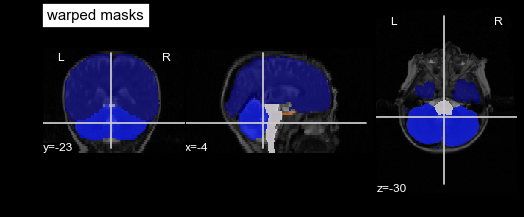

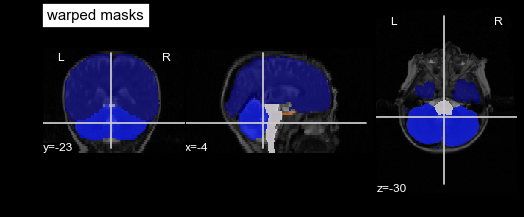

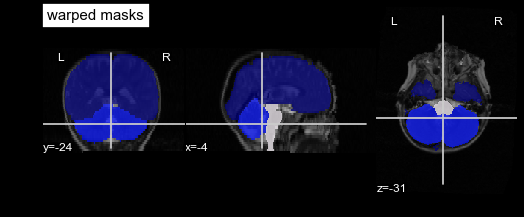

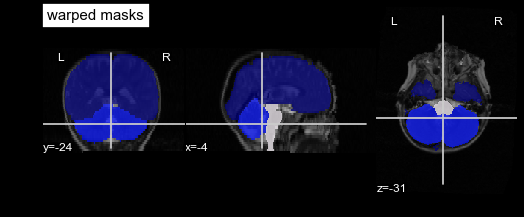

In [12]:
#subjects = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz']
#nfiles = len(subjects)
#print( nfiles )
#N = nfiles
#vols = np.ndarray((N,))

for sub in subjectsS:
    pathSeg = "{dir}{sub}".format( dir=segCbW, sub=sub )
    print( pathSeg )
    
    for subj in subjectsA:
        subAnat = sub
        subAna = subAnat.split( "_" )
        #print( subAna[0] )
        #print( subAna[1] )
        #print( subAna[2] )
        subA = subAna[0]+"_"+subAna[1]+"_to1437_V3_Warped.nii.gz"
        #print( subA )
        pathAnat = "{dir}{sub}".format( dir=anatW, sub=subA )
        print( pathAnat )
        
        seg = nib.load( pathSeg )
        #print( seg )
        #anat = load_img( pathAnat )
        anat = nib.load( pathAnat )
        #print( anat )
        
        # cut in x-direction
        sagittal = -25
        # cut in y-direction
        coronal = -37
        # cut in z-direction
        axial = -6
        # coordinates displaying should be prepared as a list
        cut_coords = [sagittal, coronal, axial]
        
        #nilearn.plotting.plot_roi(seg, bg_img=anat, cut_coords=cut_coords, output_file=None, display_mode='ortho', figure=None, axes=None, title=None, annotate=True, draw_cross=True, black_bg='auto', alpha=0.7, cmap=<matplotlib.colors.LinearSegmentedColormap object at 0x2b1ecaf13f90>, dim='auto', vmin=None, vmax=None, **kwargs)
        #plotting.plot_anat( seg )
        #plot_roi( seg, anat )
        #for saving output_file='filename' 
        plot_roi( seg, anat, title='warped masks' )

    

#some random code snippets for plotting
    print( data.shape )
    print( data.shape[0] )
    
    
    
    plot_stat_map(log_p_values_img, mean_img,
              title='Thresholded p-values', annotate=False,
              colorbar=False, cut_coords=cut_coords)
    
    plt.imshow(Image1, cmap='gray') # I would add interpolation='none'
Afterwards, you can easily overlay the segmentation by doing:

plt.imshow(Image2_mask, cmap='jet', alpha=0.5) # interpolation='none'


import numpy as np
mask = np.zeros((10,10))
mask[3:-3, 3:-3] = 1 # white square in black background
im = mask + np.random.randn(10,10) * 0.01 # random image
masked = np.ma.masked_where(mask == 0, mask)

import matplotlib.pyplot as plt
plt.figure()
plt.subplot(1,2,1)
plt.imshow(im, 'gray', interpolation='none')
plt.subplot(1,2,2)
plt.imshow(im, 'gray', interpolation='none')
plt.imshow(masked, 'jet', interpolation='none', alpha=0.7)
plt.show()


#cut in x-direction
sagittal = -25
#cut in y-direction
coronal = -37
#cut in z-direction
axial = -6

#coordinates displaying should be prepared as a list
cut_coords = [sagittal, coronal, axial]

nilearn.plotting.plot_roi(roi_img, bg_img=<MNI152Template>, cut_coords=None, output_file=None, display_mode='ortho', figure=None, axes=None, title=None, annotate=True, draw_cross=True, black_bg='auto', alpha=0.7, cmap=<matplotlib.colors.LinearSegmentedColormap object at 0x2b1ecaf13f90>, dim='auto', vmin=None, vmax=None, **kwargs)

    

# 8 Create average mask
this could either be the mode of all (load them all into one array, check which value is the most frequent for each voxel and assign this one to the new mask) <br>
or checkout ants template creation <br>

scipy.stats.mode(a, axis=0, nan_policy='propagate')[source] <br>
Returns an array of the modal (most common) value in the passed array.

If there is more than one such value, only the smallest is returned. The bin-count for the modal bins is also returned.

Parameters:	
a : array_like
n-dimensional array of which to find mode(s).
axis : int or **None**, optional
Axis along which to operate. Default is 0. If None, compute over the whole array a.
nan_policy : {‘propagate’, ‘raise’, ‘omit’}, optional
Defines how to handle when input contains nan. ‘propagate’ returns nan, ‘raise’ throws an error, ‘omit’ performs the calculations ignoring nan values. Default is ‘propagate’.
Returns:	
mode : ndarray
Array of modal values.
count : ndarray
Array of counts for each mode.


In [ ]:
%%bash
#regSegCbTo1437_V3 contains all manual segmentations (#44) in one same space (1437_V3)
#create subject list
cd /Users/katja/NIHPD/regSegCbTo1437_V3
ls 1* > subjects_regSegCb.txt

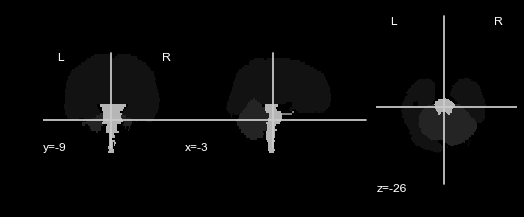

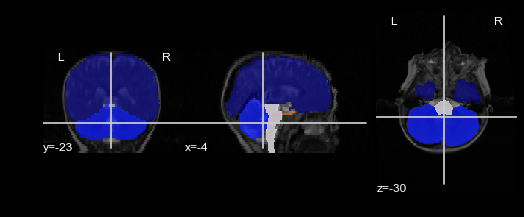

In [110]:

seg = nib.load('/Users/katja/NIHPD/regSegCbTo1437_V3/1437_V1_Cb_WarpedTo1437_V3.nii.gz')
plotting.plot_anat( seg )
anat = nib.load( '/Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to1437_V3_Warped.nii.gz')
plot_roi( seg, anat )

In [111]:
data = seg.get_data()
#print( data )
print(data[100][100][40])
print( data.shape )




1.0
(192, 256, 48)


In [112]:
data[10][120][12]

0.0

In [113]:
# now for more than one mask ...

In [114]:
subjects = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz', '1437_V3_Cb_WarpedTo1437_V3.nii.gz', '1437_V4_Cb_WarpedTo1437_V3.nii.gz', '1437_V5_Cb_WarpedTo1437_V3.nii.gz', '1460_V1_Cb_WarpedTo1437_V3.nii.gz', '1460_V2_Cb_WarpedTo1437_V3.nii.gz', '1460_V3_Cb_WarpedTo1437_V3.nii.gz', '1460_V4_Cb_WarpedTo1437_V3.nii.gz', '1460_V5_Cb_WarpedTo1437_V3.nii.gz', '1460_V6_Cb_WarpedTo1437_V3.nii.gz', '1460_V7_Cb_WarpedTo1437_V3.nii.gz', '1460_V8_Cb_WarpedTo1437_V3.nii.gz', '1460_V9_Cb_WarpedTo1437_V3.nii.gz', '1468_V10_Cb_WarpedTo1437_V3.nii.gz', '1468_V3_Cb_WarpedTo1437_V3.nii.gz', '1468_V4_Cb_WarpedTo1437_V3.nii.gz', '1468_V5_Cb_WarpedTo1437_V3.nii.gz', '1468_V6_Cb_WarpedTo1437_V3.nii.gz', '1468_V7_Cb_WarpedTo1437_V3.nii.gz', '1468_V8_Cb_WarpedTo1437_V3.nii.gz', '1468_V9_Cb_WarpedTo1437_V3.nii.gz', '1472_V1_Cb_WarpedTo1437_V3.nii.gz', '1472_V2_Cb_WarpedTo1437_V3.nii.gz', '1472_V3_Cb_WarpedTo1437_V3.nii.gz', '1472_V6_Cb_WarpedTo1437_V3.nii.gz', '1472_V7_Cb_WarpedTo1437_V3.nii.gz', '1484_V1_Cb_WarpedTo1437_V3.nii.gz', '1553_V1_Cb_WarpedTo1437_V3.nii.gz', '1553_V2_Cb_WarpedTo1437_V3.nii.gz', '1553_V3_Cb_WarpedTo1437_V3.nii.gz', '1553_V4_Cb_WarpedTo1437_V3.nii.gz', '1553_V5_Cb_WarpedTo1437_V3.nii.gz', '1553_V6_Cb_WarpedTo1437_V3.nii.gz', '1553_V7_Cb_WarpedTo1437_V3.nii.gz', '1555_V1_Cb_WarpedTo1437_V3.nii.gz', '1555_V2_Cb_WarpedTo1437_V3.nii.gz', '1555_V3_Cb_WarpedTo1437_V3.nii.gz', '1555_V4_Cb_WarpedTo1437_V3.nii.gz', '1555_V5_Cb_WarpedTo1437_V3.nii.gz', '1555_V6_Cb_WarpedTo1437_V3.nii.gz', '1555_V7_Cb_WarpedTo1437_V3.nii.gz', '1555_V8_Cb_WarpedTo1437_V3.nii.gz']
#subjects = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz']
# segmentations in 1437_V3 space
segCbW = '/Users/katja/NIHPD/regSegCbTo1437_V3/'


In [115]:
# store segmentations into an array 
segs = []
for sub in subjects:
    path = "{dir}{sub}".format( dir=segCbW, sub=sub )
    seg = nib.load( path )
    segs.append( seg )
    
print( segs )
    

[<nibabel.nifti1.Nifti1Image object at 0x10f5a4510>, <nibabel.nifti1.Nifti1Image object at 0x1169e9f50>, <nibabel.nifti1.Nifti1Image object at 0x11ad3c890>, <nibabel.nifti1.Nifti1Image object at 0x11ad3c990>, <nibabel.nifti1.Nifti1Image object at 0x11ac28790>, <nibabel.nifti1.Nifti1Image object at 0x11ac28950>, <nibabel.nifti1.Nifti1Image object at 0x11ac281d0>, <nibabel.nifti1.Nifti1Image object at 0x11ad0bc50>, <nibabel.nifti1.Nifti1Image object at 0x11ad0b450>, <nibabel.nifti1.Nifti1Image object at 0x1167e0590>, <nibabel.nifti1.Nifti1Image object at 0x1167e0090>, <nibabel.nifti1.Nifti1Image object at 0x1167e0a10>, <nibabel.nifti1.Nifti1Image object at 0x1169bcf50>, <nibabel.nifti1.Nifti1Image object at 0x1167e0cd0>, <nibabel.nifti1.Nifti1Image object at 0x1167d0f10>, <nibabel.nifti1.Nifti1Image object at 0x11ac30e50>, <nibabel.nifti1.Nifti1Image object at 0x11ac30690>, <nibabel.nifti1.Nifti1Image object at 0x11ac30590>, <nibabel.nifti1.Nifti1Image object at 0x11ac30bd0>, <nibabel.ni

In [116]:
print( segs[0] )
#print( segs[0].header )
print( segs[0].get_data().shape )
x = segs[0].get_data()[100][100][40]
print( 'x =' , x )
print( 'length of segs array:', len( segs ) )

<class 'nibabel.nifti1.Nifti1Image'>
data shape (192, 256, 48)
affine: 
[[  -1.    -0.     0.    95.5]
 [  -0.     1.    -0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]
metadata:
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  48   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.  1.  1.  3.  0.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 2
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : 
aux_file        : 
qform_code      : aligned
sform_code  

In [136]:
# values in the segmentations are: 0, 1, 2, 10

# get mode and frequency
#print( data.shape[0] )

mode=np.ndarray( (data.shape[0],data.shape[1],data.shape[2]), dtype=np.float32 )
freq=np.ndarray( (data.shape[0],data.shape[1],data.shape[2]), dtype=np.float32 )
for i in range( 0, data.shape[0] ):
    print i
    for j in range( 0, data.shape[1] ):
        for k in range( 0, data.shape[2] ):
            x = []
            for l in range( 0, len( segs )):
                val = segs[l].get_data()[i][j][k]
                x.append( val )
            m,f = stats.mode( x )
            mode[i][j][k]=m[0]
            freq[i][j][k]=f[0]

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191


In [137]:
print( len(mode) )
print( len(freq) )
print( mode.shape )
print( mode.dtype )
print( freq.dtype )

192
192
(192, 256, 48)
float32
float32


In [138]:
modeimg=nib.Nifti1Image( mode, segs[0].affine )
freqimg=nib.Nifti1Image( freq, segs[0].affine )

print( modeimg.header )

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : 
dim_info        : 0
dim             : [  3 192 256  48   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [-1.  1.  1.  3.  1.  1.  1.  1.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 0
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : 
aux_file        : 
qform_code      : unknown
sform_code      : aligned
quatern_b       : 0.0
quatern_c       : 1.0
quatern_d       : 0.0
qoffset_x       : 95.5
qoffset_y       : -127.5
qoffset_z       : -70.5
srow_x          : [ -1.   -0.    0.   95.5]
srow_y      

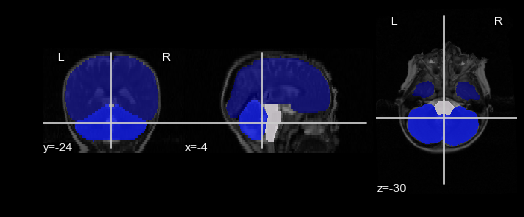

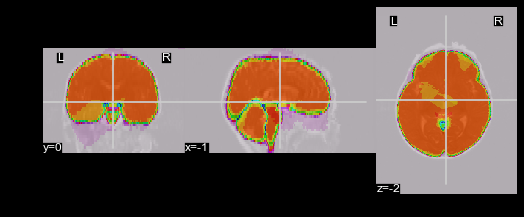

In [139]:
plotting.plot_roi( modeimg, anat )
plotting.plot_roi( freqimg, anat )

In [140]:
#some try-to-see-if-it-worked
#mode[100][100][20]
i=87
x=[]
for s in range(0,43):
    x.append(segs[s].get_data()[i][100][20])


In [141]:
m,f=stats.mode(x)

In [142]:
f[0]

28

In [143]:
data.shape

(192, 256, 48)

In [148]:
nib.nifti1.save( modeimg, '/Users/katja/NIHPD/regSegCbTo1437_V3/modeSeg.nii.gz' )
nib.nifti1.save( freqimg, '/Users/katja/NIHPD/regSegCbTo1437_V3/freqSeg.nii.gz' )


In [ ]:
# check with mango: wow!
# and surface reconstruction from it: wow! <3 

#following: some random code snippets during trying

#segs = []
#for i in range( data.shape[0] ):
    #for j in range( data.shape[1] ):
        #for k in range( data.shape[2] ):
            #seg = data[i][j][k]
            #segs.append( seg )
#print( segs[1299957] )

#print( len(seg) )
#print( len(segs) )
#values: 0, 1, 2, 10 

subjects = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz']
#subjects = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz', '1437_V3_Cb_WarpedTo1437_V3.nii.gz', '1437_V4_Cb_WarpedTo1437_V3.nii.gz', '1437_V5_Cb_WarpedTo1437_V3.nii.gz', '1460_V1_Cb_WarpedTo1437_V3.nii.gz', '1460_V2_Cb_WarpedTo1437_V3.nii.gz', '1460_V3_Cb_WarpedTo1437_V3.nii.gz', '1460_V4_Cb_WarpedTo1437_V3.nii.gz', '1460_V5_Cb_WarpedTo1437_V3.nii.gz', '1460_V6_Cb_WarpedTo1437_V3.nii.gz', '1460_V7_Cb_WarpedTo1437_V3.nii.gz', '1460_V8_Cb_WarpedTo1437_V3.nii.gz', '1460_V9_Cb_WarpedTo1437_V3.nii.gz', '1468_V10_Cb_WarpedTo1437_V3.nii.gz', '1468_V3_Cb_WarpedTo1437_V3.nii.gz', '1468_V4_Cb_WarpedTo1437_V3.nii.gz', '1468_V5_Cb_WarpedTo1437_V3.nii.gz', '1468_V6_Cb_WarpedTo1437_V3.nii.gz', '1468_V7_Cb_WarpedTo1437_V3.nii.gz', '1468_V8_Cb_WarpedTo1437_V3.nii.gz', '1468_V9_Cb_WarpedTo1437_V3.nii.gz', '1472_V1_Cb_WarpedTo1437_V3.nii.gz', '1472_V2_Cb_WarpedTo1437_V3.nii.gz', '1472_V3_Cb_WarpedTo1437_V3.nii.gz', '1472_V6_Cb_WarpedTo1437_V3.nii.gz', '1472_V7_Cb_WarpedTo1437_V3.nii.gz', '1484_V1_Cb_WarpedTo1437_V3.nii.gz', '1553_V1_Cb_WarpedTo1437_V3.nii.gz', '1553_V2_Cb_WarpedTo1437_V3.nii.gz', '1553_V3_Cb_WarpedTo1437_V3.nii.gz', '1553_V4_Cb_WarpedTo1437_V3.nii.gz', '1553_V5_Cb_WarpedTo1437_V3.nii.gz', '1553_V6_Cb_WarpedTo1437_V3.nii.gz', '1553_V7_Cb_WarpedTo1437_V3.nii.gz', '1555_V1_Cb_WarpedTo1437_V3.nii.gz', '1555_V2_Cb_WarpedTo1437_V3.nii.gz', '1555_V3_Cb_WarpedTo1437_V3.nii.gz', '1555_V4_Cb_WarpedTo1437_V3.nii.gz', '1555_V5_Cb_WarpedTo1437_V3.nii.gz', '1555_V6_Cb_WarpedTo1437_V3.nii.gz', '1555_V7_Cb_WarpedTo1437_V3.nii.gz', '1555_V8_Cb_WarpedTo1437_V3.nii.gz']

#segmentations in 1437_V3 space
segCbW = '/Users/katja/NIHPD/regSegCbTo1437_V3/'
#mask = nib.load('/Users/katja/NIHPD/segmentations/1437_V1_Cerebellum.nii.gz')

subjects = ['1437_V1_Cb_WarpedTo1437_V3.nii.gz', '1437_V2_Cb_WarpedTo1437_V3.nii.gz', '1437_V3_Cb_WarpedTo1437_V3.nii.gz']
#nfiles = len(subjects)
#print( nfiles )
#N = nfiles
#vols = np.ndarray((N,))

paths = []
for sub in subjects:
    path = "{dir}{sub}".format( dir=segCbW, sub=sub )
    print( path )
    paths.append( path )
    print( paths )
    img = nib.load( path )
    img = concat_imgs( paths )

#print( img )  

data = img.get_data()
#print( data )
print( data.shape )

print(data[16][13][12])


#sp.stats.mode(data, axis=0, nan_policy='propagate')

    


for sub in subjects:
    img = load_img( path ) 
    data=img.get_data()

    print( data.shape )
    print( data.shape[0] )
    
     for i in range( 0, data.shape[0] )
        for j in range( 0, data.shape[1] )
            for k in range( 0, data.shape[2] )
                segs = data[i][j][k]
            
    

    #let’s say for the sake of the example that shape is (100,120,140), then
    #for i in range(0,100):
        #for j in range(0,120):
            #for k in range(0,140):
                #x=data[i][j][k]
    #will get you the data at each voxel


segmentations = []
for sub in subjects:
    path = "{dir}{sub}".format( dir=segCbW, sub=sub )
    print( path )
    seg = nib.load( path )
    #print seg
    segmentations.append( [seg] )
    print( segmentations )
    print( segmentations[0])
    
    #plotting doesn't work for so many images
    #max = seg.get_data().max()
    #plotting.plot_anat( seg, vmax=max )
    
    
    
    #nib.nifti1.save( seg, segCb+sub )
    #a=sub.split("_")
    #print a 
    #nib.nifti1.save( seg, segCb+a[0]+'_'+a[1]+'_Cerebellum.nii.gz' )
    
    

# 9 Warp mode segmentation into each anatomical space

###    note for a possible next try:
maybe try to resample the anatomical images first (so that they are 1mm isotropic; this could prevent me from finding these artefacts that the cerebellum and cerebrum outlines often appear so zackelig :/  which may result from a little tilt in the brain I am aligning to ....

In [102]:
%%bash
cd /Users/katja/NIHPD
mkdir mode2anat

In [149]:
nib.nifti1.save( modeimg, '/Users/katja/NIHPD/mode2anat/modeSeg.nii.gz' )
nib.nifti1.save( freqimg, '/Users/katja/NIHPD/mode2anat/freqSeg.nii.gz' )

In [150]:
%%bash
# register mode segmentation onto anatomy: apply inverse transform
# wim 3 seg segWarped -R structTemplate.nii.gz -i affine.mat warpfile.nii.gz

data=/Users/katja/NIHPD
mode=modeSeg.nii.gz

#struc=/Users/katja/NIHPD/T2w/1437_V3 #(sub)
subjects=('1437_V1.nii.gz' '1437_V2.nii.gz' '1437_V3.nii.gz' '1437_V4.nii.gz' '1437_V5.nii.gz' '1460_V1.nii.gz' '1460_V2.nii.gz' '1460_V3.nii.gz' '1460_V4.nii.gz' '1460_V5.nii.gz' '1460_V6.nii.gz' '1460_V7.nii.gz' '1460_V8.nii.gz' '1460_V9.nii.gz' '1468_V10.nii.gz' '1468_V3.nii.gz' '1468_V4.nii.gz' '1468_V5.nii.gz' '1468_V6.nii.gz' '1468_V7.nii.gz' '1468_V8.nii.gz' '1468_V9.nii.gz' '1472_V1.nii.gz' '1472_V2.nii.gz' '1472_V3.nii.gz' '1472_V4.nii.gz' '1472_V6.nii.gz' '1472_V7.nii.gz' '1484_V1.nii.gz' '1484_V3.nii.gz' '1484_V4.nii.gz' '1484_V5.nii.gz' '1484_V6.nii.gz' '1484_V7.nii.gz' '1484_V8.nii.gz' '1502_V1.nii.gz' '1502_V2.nii.gz' '1502_V3.nii.gz' '1502_V4.nii.gz' '1502_V5.nii.gz' '1502_V6.nii.gz' '1502_V7.nii.gz' '1507_V1.nii.gz' '1507_V2.nii.gz' '1507_V3.nii.gz' '1507_V4.nii.gz' '1507_V5.nii.gz' '1508_V1.nii.gz' '1508_V2.nii.gz' '1508_V3.nii.gz' '1508_V4.nii.gz' '1508_V5.nii.gz' '1508_V6.nii.gz' '1508_V7.nii.gz' '1508_V8.nii.gz' '1510_V1.nii.gz' '1510_V2.nii.gz' '1510_V3.nii.gz' '1510_V4.nii.gz' '1510_V5.nii.gz' '1510_V6.nii.gz' '1510_V7.nii.gz' '1510_V8.nii.gz' '1515_V1.nii.gz' '1515_V2.nii.gz' '1515_V3.nii.gz' '1515_V4.nii.gz' '1515_V5.nii.gz' '1515_V6.nii.gz' '1515_V7.nii.gz' '1525_V1.nii.gz' '1525_V2.nii.gz' '1525_V3.nii.gz' '1525_V4.nii.gz' '1525_V5.nii.gz' '1525_V6.nii.gz' '1528_V1.nii.gz' '1528_V2.nii.gz' '1528_V3.nii.gz' '1528_V4.nii.gz' '1528_V5.nii.gz' '1528_V7.nii.gz' '1531_V1.nii.gz' '1531_V2.nii.gz' '1531_V3.nii.gz' '1531_V4.nii.gz' '1531_V5.nii.gz' '1543_V1.nii.gz' '1543_V2.nii.gz' '1543_V4.nii.gz' '1543_V5.nii.gz' '1543_V6.nii.gz' '1548_V1.nii.gz' '1548_V2.nii.gz' '1548_V3.nii.gz' '1548_V4.nii.gz' '1548_V5.nii.gz' '1548_V6.nii.gz' '1548_V7.nii.gz' '1553_V1.nii.gz' '1553_V2.nii.gz' '1553_V3.nii.gz' '1553_V4.nii.gz' '1553_V5.nii.gz' '1553_V6.nii.gz' '1553_V7.nii.gz' '1555_V1.nii.gz' '1555_V2.nii.gz' '1555_V3.nii.gz' '1555_V4.nii.gz' '1555_V5.nii.gz' '1555_V6.nii.gz' '1555_V7.nii.gz' '1555_V8.nii.gz')

for i in ${subjects[@]}; do
    /Applications/ants/bin/WarpImageMultiTransform 3 \
        $data/regSegCbTo1437_V3/$mode \
        $data/mode2anat/${i%.nii.gz}_mode.nii.gz \
        -R $data/T2w/${i} \
        --use-NN \
        -i $data/regAnatSegTo1437_V3/${i%.nii.gz}_to_1437_V30GenericAffine.mat $data/regAnatSegTo1437_V3/${i%.nii.gz}_to_1437_V31InverseWarp.nii.gz                               
done


AFFINE-INV: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V30GenericAffine.mat
FIELD: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V31InverseWarp.nii.gz
moving_image_filename: /Users/katja/NIHPD/regSegCbTo1437_V3/modeSeg.nii.gz components 1
output_image_filename: /Users/katja/NIHPD/mode2anat/1437_V1_mode.nii.gz
reference_image_filename: /Users/katja/NIHPD/T2w/1437_V1.nii.gz
[0/2]: AFFINE-INV: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V30GenericAffine.mat
[1/2]: FIELD: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V1_to_1437_V31InverseWarp.nii.gz
User nearest neighbor interpolation (was Haha) 
  We check the syntax of your call .... 
 syntax probably ok. 
output origin: [-95.5, 127.5, -70.5]
output size: [192, 256, 48]
output spacing: [1, 1, 3]
output direction: 1 0 0
0 -1 0
0 0 1

AFFINE-INV: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V2_to_1437_V30GenericAffine.mat
FIELD: /Users/katja/NIHPD/regAnatSegTo1437_V3/1437_V2_to_1437_V31InverseWarp.nii.gz
moving

### Notes for me
1: upload all automatic warped segmentations into new vol annotation <br>
2: add all 3 seg values together to create ICV masks for all subjects based on the cerebellum segmentation <br>
3: upload those all into new vol annotation <br>
4: do QC on the two of them, if I modify the auto one, it receives manual tag <br>
5: in the end: have one annotation ICV form the warped; one vol annotation cerebellum with all the manually modified or automatic masks <br>
6: create new volume annotation and draw the contour as well as gyri outline (where sulci / gyri must not touch!!) in two different colors (1 and 9 ;)

# 10 Upload the warped mode segmentations to BrainBox
### 10.1 First: upload the automatically generated segmentations in cerebellum segementation for the subjects where there is none

In [196]:
%%bash
#links to all files where no manual segmentation exists
links=('https://dl.dropbox.com/s/j11i15mc40qzvao/1484_V3_f.nii.gz' 'https://dl.dropbox.com/s/ee0q6de5mvdokp7/1484_V4_f.nii.gz' 'https://dl.dropbox.com/s/ipg8pp15e3hmh4b/1484_V5_f.nii.gz' 'https://dl.dropbox.com/s/izutla83ob5hd0h/1484_V6_f.nii.gz' 'https://dl.dropbox.com/s/z4jmw0x1vpanzrv/1484_V7_f.nii.gz' 'https://dl.dropbox.com/s/l34mbunkezexvh5/1484_V8_f.nii.gz' 'https://dl.dropbox.com/s/7jy2erq59trv5nb/1502_V1_f.nii.gz' 'https://dl.dropbox.com/s/763m1hhnbsi4kb1/1502_V2_f.nii.gz' 'https://dl.dropbox.com/s/e8oho2n7fzy3slq/1502_V3_f.nii.gz' 'https://dl.dropbox.com/s/bytu72l8r2cnnu7/1502_V4_f.nii.gz' 'https://dl.dropbox.com/s/76n90akqmh02khk/1502_V5_f.nii.gz' 'https://dl.dropbox.com/s/8kmc7z999ik52fz/1502_V6_f.nii.gz' 'https://dl.dropbox.com/s/bml0mn6ws30hpxx/1502_V7_f.nii.gz' 'https://dl.dropbox.com/s/3fw51uhrqgj64fh/1507_V1_f.nii.gz' 'https://dl.dropbox.com/s/jibmqkgdszm8xdy/1507_V2_f.nii.gz' 'https://dl.dropbox.com/s/2c1hsgpw7k06iz1/1507_V3_f.nii.gz' 'https://dl.dropbox.com/s/2qdmywx8lthfpdb/1507_V4_f.nii.gz' 'https://dl.dropbox.com/s/sbygekcxwv4kbc6/1507_V5_f.nii.gz' 'https://dl.dropbox.com/s/ytosgfrpww3gml4/1508_V1_f.nii.gz' 'https://dl.dropbox.com/s/5zvttjkmehwsxqx/1508_V2_f.nii.gz' 'https://dl.dropbox.com/s/71f38o8mzlah9yv/1508_V3_f.nii.gz' 'https://dl.dropbox.com/s/51e91lh91bcujfe/1508_V4_f.nii.gz' 'https://dl.dropbox.com/s/js58gbxawqj8u6t/1508_V5_f.nii.gz' 'https://dl.dropbox.com/s/qelmuhzhwcfudfv/1508_V6_f.nii.gz' 'https://dl.dropbox.com/s/p6fh0smtnqlcrd5/1508_V7_f.nii.gz' 'https://dl.dropbox.com/s/kd15u7ttpmfnc34/1508_V8_f.nii.gz' 'https://dl.dropbox.com/s/ffos4222lsenbm5/1510_V1_f.nii.gz' 'https://dl.dropbox.com/s/w3sdlldpazyivtu/1510_V2_f.nii.gz' 'https://dl.dropbox.com/s/si6ayzwgmo9tmff/1510_V3_f.nii.gz' 'https://dl.dropbox.com/s/l1h9agkseqqao8k/1510_V4_f.nii.gz' 'https://dl.dropbox.com/s/m7igy6lo98jhmrs/1510_V5_f.nii.gz' 'https://dl.dropbox.com/s/jkbr738mc03ag7s/1510_V6_f.nii.gz' 'https://dl.dropbox.com/s/e5qvqe0ndteyxha/1510_V7_f.nii.gz' 'https://dl.dropbox.com/s/2u3o384yqsgoytb/1510_V8_f.nii.gz' 'https://dl.dropbox.com/s/9kyqv1wxfpath5q/1515_V1_f.nii.gz' 'https://dl.dropbox.com/s/a23l04rt1qfiaa7/1515_V2_f.nii.gz' 'https://dl.dropbox.com/s/t05vlw2akam0g4p/1515_V3_f.nii.gz' 'https://dl.dropbox.com/s/lr7smq2hbq755ol/1515_V4_f.nii.gz' 'https://dl.dropbox.com/s/dgbrjkr2zguf6pz/1515_V5_f.nii.gz' 'https://dl.dropbox.com/s/xbly0rblk1xukwt/1515_V6_f.nii.gz' 'https://dl.dropbox.com/s/acjxul2iztfkavo/1515_V7_f.nii.gz' 'https://dl.dropbox.com/s/v1w20m5l6wxnuvh/1525_V1_f.nii.gz' 'https://dl.dropbox.com/s/ljtexe2y8c5i7fw/1525_V2_f.nii.gz' 'https://dl.dropbox.com/s/hjbr8smuzrg1wi7/1525_V3_f.nii.gz' 'https://dl.dropbox.com/s/ju6td40ns0txgbz/1525_V4_f.nii.gz' 'https://dl.dropbox.com/s/ph3ewdopso4p5ug/1525_V5_f.nii.gz' 'https://dl.dropbox.com/s/hhm9o3vondgeyua/1525_V6_f.nii.gz' 'https://dl.dropbox.com/s/uehhrbpeg51igyj/1528_V1_f.nii.gz' 'https://dl.dropbox.com/s/7f6e64w19cg03z4/1528_V2_f.nii.gz' 'https://dl.dropbox.com/s/6raxwisfe2phid3/1528_V3_f.nii.gz' 'https://dl.dropbox.com/s/nwzjgxz5ay6o64r/1528_V4_f.nii.gz' 'https://dl.dropbox.com/s/jk1fgmtpgrt6di7/1528_V5_f.nii.gz' 'https://dl.dropbox.com/s/jto5oaiumt1i83i/1528_V7_f.nii.gz' 'https://dl.dropbox.com/s/5rpizw3nt2mqc29/1531_V1_f.nii.gz' 'https://dl.dropbox.com/s/32sje6ecft9nakr/1531_V2_f.nii.gz' 'https://dl.dropbox.com/s/ameetipw0tz15m0/1531_V3_f.nii.gz' 'https://dl.dropbox.com/s/0zate80oyjx69g8/1531_V4_f.nii.gz' 'https://dl.dropbox.com/s/o1zny0pzsqh89kr/1531_V5_f.nii.gz' 'https://dl.dropbox.com/s/273za22j7s81ir1/1543_V1_f.nii.gz' 'https://dl.dropbox.com/s/hu449mhdihfqetn/1543_V2_f.nii.gz' 'https://dl.dropbox.com/s/6rsvbj20ww0m9we/1543_V4_f.nii.gz' 'https://dl.dropbox.com/s/k2t6a77lgdq6nhz/1543_V5_f.nii.gz' 'https://dl.dropbox.com/s/yukeyagxqjk4zvn/1543_V6_f.nii.gz' 'https://dl.dropbox.com/s/hio2ezu1w6frh7g/1548_V1_f.nii.gz' 'https://dl.dropbox.com/s/7f7g1onfnsmyc2t/1548_V2_f.nii.gz' 'https://dl.dropbox.com/s/sba3b9hlxuncia5/1548_V3_f.nii.gz' 'https://dl.dropbox.com/s/bxhabj40xxtp406/1548_V4_f.nii.gz' 'https://dl.dropbox.com/s/zse457oaj3jzhce/1548_V5_f.nii.gz' 'https://dl.dropbox.com/s/r39ihlnkqktx3ut/1548_V6_f.nii.gz' 'https://dl.dropbox.com/s/r6tanqwyxymumt4/1548_V7_f.nii.gz')
#links=('https://dl.dropbox.com/s/j11i15mc40qzvao/1484_V3_f.nii.gz')
pathToSeg=/Users/katja/NIHPD/mode2anat

for i in ${links[@]}; do
    sub=${i##*/}
    #echo $sub
    subj=${sub%_f.nii.gz}_mode.nii.gz
    #echo $subj
    #echo ${i}
    #echo $i
    curl -F url=${i} -F atlasName=Cerebellum -F atlasProject=nihpd2 -F atlasLabelSet=freestyle.json -F atlas=@${pathToSeg}/${subj} -F token=ju5zsegv9rnyu8frgqiou2npupp919k9 http://brainbox.pasteur.fr/mri/upload
done

Process is interrupted.


### 10.2 Second: upload all automatically generated segmentations into 'cerebellum consus' segementation for all subjects

In [16]:
%%bash
#links to all files
links=('https://dl.dropbox.com/s/6lhozadlod3uunh/1437_V1_f.nii.gz' 'https://dl.dropbox.com/s/wg24u4q0ns5puub/1437_V2_f.nii.gz' 'https://dl.dropbox.com/s/hztz4s1r4a4o9zx/1437_V3_f.nii.gz' 'https://dl.dropbox.com/s/hka2x4ylakm4ut0/1437_V4_f.nii.gz' 'https://dl.dropbox.com/s/qhbnm5hrfwp6meq/1437_V5_f.nii.gz' 'https://dl.dropbox.com/s/1dfwy529yn3ha77/1460_V1_f.nii.gz' 'https://dl.dropbox.com/s/5b9w1wuqv6bprrz/1460_V2_f.nii.gz' 'https://dl.dropbox.com/s/u14l442aacbyquv/1460_V3_f.nii.gz' 'https://dl.dropbox.com/s/33qjymtm05756yu/1460_V4_f.nii.gz' 'https://dl.dropbox.com/s/akv9ix8enh3mitw/1460_V5_f.nii.gz' 'https://dl.dropbox.com/s/20f0k3mn8sqlfq0/1460_V6_f.nii.gz' 'https://dl.dropbox.com/s/5qa6szzev32sbct/1460_V7_f.nii.gz' 'https://dl.dropbox.com/s/6igh1qpl81xzk3f/1460_V8_f.nii.gz' 'https://dl.dropbox.com/s/cgcund4tphzkxoc/1460_V9_f.nii.gz' 'https://dl.dropbox.com/s/bsxjkbk8ghpjlhj/1468_V3_f.nii.gz' 'https://dl.dropbox.com/s/3j6mxxtp7kk6clx/1468_V4_f.nii.gz' 'https://dl.dropbox.com/s/orklcizdbyffite/1468_V5_f.nii.gz' 'https://dl.dropbox.com/s/rmfhia72mq7o466/1468_V6_f.nii.gz' 'https://dl.dropbox.com/s/e2par31u99n2vm9/1468_V7_f.nii.gz' 'https://dl.dropbox.com/s/7zps6tovwr8tzte/1468_V8_f.nii.gz' 'https://dl.dropbox.com/s/l5h4cc9l3zwk16e/1468_V9_f.nii.gz' 'https://dl.dropbox.com/s/v7yvszi17jtgha8/1468_V10_f.nii.gz' 'https://dl.dropbox.com/s/of9sg75y6p343f7/1472_V1_f.nii.gz' 'https://dl.dropbox.com/s/089wlegrp20sziu/1472_V2_f.nii.gz' 'https://dl.dropbox.com/s/rgcib095016v6at/1472_V3_f.nii.gz' 'https://dl.dropbox.com/s/mhw15a5zyybes4h/1472_V4_f.nii.gz' 'https://dl.dropbox.com/s/pqghhgo3kz58bln/1472_V6_f.nii.gz' 'https://dl.dropbox.com/s/sfqb61rnbhz03bw/1472_V7_f.nii.gz' 'https://dl.dropbox.com/s/mo4mt8a9l4vsg1o/1484_V1_f.nii.gz' 'https://dl.dropbox.com/s/j11i15mc40qzvao/1484_V3_f.nii.gz' 'https://dl.dropbox.com/s/ee0q6de5mvdokp7/1484_V4_f.nii.gz' 'https://dl.dropbox.com/s/ipg8pp15e3hmh4b/1484_V5_f.nii.gz' 'https://dl.dropbox.com/s/izutla83ob5hd0h/1484_V6_f.nii.gz' 'https://dl.dropbox.com/s/z4jmw0x1vpanzrv/1484_V7_f.nii.gz' 'https://dl.dropbox.com/s/l34mbunkezexvh5/1484_V8_f.nii.gz' 'https://dl.dropbox.com/s/7jy2erq59trv5nb/1502_V1_f.nii.gz' 'https://dl.dropbox.com/s/763m1hhnbsi4kb1/1502_V2_f.nii.gz' 'https://dl.dropbox.com/s/e8oho2n7fzy3slq/1502_V3_f.nii.gz' 'https://dl.dropbox.com/s/bytu72l8r2cnnu7/1502_V4_f.nii.gz' 'https://dl.dropbox.com/s/76n90akqmh02khk/1502_V5_f.nii.gz' 'https://dl.dropbox.com/s/8kmc7z999ik52fz/1502_V6_f.nii.gz' 'https://dl.dropbox.com/s/bml0mn6ws30hpxx/1502_V7_f.nii.gz' 'https://dl.dropbox.com/s/3fw51uhrqgj64fh/1507_V1_f.nii.gz' 'https://dl.dropbox.com/s/jibmqkgdszm8xdy/1507_V2_f.nii.gz' 'https://dl.dropbox.com/s/2c1hsgpw7k06iz1/1507_V3_f.nii.gz' 'https://dl.dropbox.com/s/2qdmywx8lthfpdb/1507_V4_f.nii.gz' 'https://dl.dropbox.com/s/sbygekcxwv4kbc6/1507_V5_f.nii.gz' 'https://dl.dropbox.com/s/ytosgfrpww3gml4/1508_V1_f.nii.gz' 'https://dl.dropbox.com/s/5zvttjkmehwsxqx/1508_V2_f.nii.gz' 'https://dl.dropbox.com/s/71f38o8mzlah9yv/1508_V3_f.nii.gz' 'https://dl.dropbox.com/s/51e91lh91bcujfe/1508_V4_f.nii.gz' 'https://dl.dropbox.com/s/js58gbxawqj8u6t/1508_V5_f.nii.gz' 'https://dl.dropbox.com/s/qelmuhzhwcfudfv/1508_V6_f.nii.gz' 'https://dl.dropbox.com/s/p6fh0smtnqlcrd5/1508_V7_f.nii.gz' 'https://dl.dropbox.com/s/kd15u7ttpmfnc34/1508_V8_f.nii.gz' 'https://dl.dropbox.com/s/ffos4222lsenbm5/1510_V1_f.nii.gz' 'https://dl.dropbox.com/s/w3sdlldpazyivtu/1510_V2_f.nii.gz' 'https://dl.dropbox.com/s/si6ayzwgmo9tmff/1510_V3_f.nii.gz' 'https://dl.dropbox.com/s/l1h9agkseqqao8k/1510_V4_f.nii.gz' 'https://dl.dropbox.com/s/m7igy6lo98jhmrs/1510_V5_f.nii.gz' 'https://dl.dropbox.com/s/jkbr738mc03ag7s/1510_V6_f.nii.gz' 'https://dl.dropbox.com/s/e5qvqe0ndteyxha/1510_V7_f.nii.gz' 'https://dl.dropbox.com/s/2u3o384yqsgoytb/1510_V8_f.nii.gz' 'https://dl.dropbox.com/s/9kyqv1wxfpath5q/1515_V1_f.nii.gz' 'https://dl.dropbox.com/s/a23l04rt1qfiaa7/1515_V2_f.nii.gz' 'https://dl.dropbox.com/s/t05vlw2akam0g4p/1515_V3_f.nii.gz' 'https://dl.dropbox.com/s/lr7smq2hbq755ol/1515_V4_f.nii.gz' 'https://dl.dropbox.com/s/dgbrjkr2zguf6pz/1515_V5_f.nii.gz' 'https://dl.dropbox.com/s/xbly0rblk1xukwt/1515_V6_f.nii.gz' 'https://dl.dropbox.com/s/acjxul2iztfkavo/1515_V7_f.nii.gz' 'https://dl.dropbox.com/s/v1w20m5l6wxnuvh/1525_V1_f.nii.gz' 'https://dl.dropbox.com/s/ljtexe2y8c5i7fw/1525_V2_f.nii.gz' 'https://dl.dropbox.com/s/hjbr8smuzrg1wi7/1525_V3_f.nii.gz' 'https://dl.dropbox.com/s/ju6td40ns0txgbz/1525_V4_f.nii.gz' 'https://dl.dropbox.com/s/ph3ewdopso4p5ug/1525_V5_f.nii.gz' 'https://dl.dropbox.com/s/hhm9o3vondgeyua/1525_V6_f.nii.gz' 'https://dl.dropbox.com/s/uehhrbpeg51igyj/1528_V1_f.nii.gz' 'https://dl.dropbox.com/s/7f6e64w19cg03z4/1528_V2_f.nii.gz' 'https://dl.dropbox.com/s/6raxwisfe2phid3/1528_V3_f.nii.gz' 'https://dl.dropbox.com/s/nwzjgxz5ay6o64r/1528_V4_f.nii.gz' 'https://dl.dropbox.com/s/jk1fgmtpgrt6di7/1528_V5_f.nii.gz' 'https://dl.dropbox.com/s/jto5oaiumt1i83i/1528_V7_f.nii.gz' 'https://dl.dropbox.com/s/5rpizw3nt2mqc29/1531_V1_f.nii.gz' 'https://dl.dropbox.com/s/32sje6ecft9nakr/1531_V2_f.nii.gz' 'https://dl.dropbox.com/s/ameetipw0tz15m0/1531_V3_f.nii.gz' 'https://dl.dropbox.com/s/0zate80oyjx69g8/1531_V4_f.nii.gz' 'https://dl.dropbox.com/s/o1zny0pzsqh89kr/1531_V5_f.nii.gz' 'https://dl.dropbox.com/s/273za22j7s81ir1/1543_V1_f.nii.gz' 'https://dl.dropbox.com/s/hu449mhdihfqetn/1543_V2_f.nii.gz' 'https://dl.dropbox.com/s/6rsvbj20ww0m9we/1543_V4_f.nii.gz' 'https://dl.dropbox.com/s/k2t6a77lgdq6nhz/1543_V5_f.nii.gz' 'https://dl.dropbox.com/s/yukeyagxqjk4zvn/1543_V6_f.nii.gz' 'https://dl.dropbox.com/s/hio2ezu1w6frh7g/1548_V1_f.nii.gz' 'https://dl.dropbox.com/s/7f7g1onfnsmyc2t/1548_V2_f.nii.gz' 'https://dl.dropbox.com/s/sba3b9hlxuncia5/1548_V3_f.nii.gz' 'https://dl.dropbox.com/s/bxhabj40xxtp406/1548_V4_f.nii.gz' 'https://dl.dropbox.com/s/zse457oaj3jzhce/1548_V5_f.nii.gz' 'https://dl.dropbox.com/s/r39ihlnkqktx3ut/1548_V6_f.nii.gz' 'https://dl.dropbox.com/s/r6tanqwyxymumt4/1548_V7_f.nii.gz' 'https://dl.dropbox.com/s/s1v0p9ek274yl70/1553_V1_f.nii.gz' 'https://dl.dropbox.com/s/bbbs6r2d7yx6308/1553_V2_f.nii.gz' 'https://dl.dropbox.com/s/0ng4975w25uenn1/1553_V3_f.nii.gz' 'https://dl.dropbox.com/s/0xuwccg5rv9zrtz/1553_V4_f.nii.gz' 'https://dl.dropbox.com/s/tizsl0vw6vxw4w9/1553_V5_f.nii.gz' 'https://dl.dropbox.com/s/ezjjsn9bvygdj3j/1553_V6_f.nii.gz' 'https://dl.dropbox.com/s/q965ciub976xd0k/1553_V7_f.nii.gz' 'https://dl.dropbox.com/s/6ojz8dwqvjcv34e/1555_V1_f.nii.gz' 'https://dl.dropbox.com/s/thkm3ew6nndrf3y/1555_V2_f.nii.gz' 'https://dl.dropbox.com/s/l3z0lvamn86s8ju/1555_V3_f.nii.gz' 'https://dl.dropbox.com/s/v946vrwn3wcptvb/1555_V4_f.nii.gz' 'https://dl.dropbox.com/s/j2jqwoncj44llrz/1555_V5_f.nii.gz' 'https://dl.dropbox.com/s/wsza758sjzglj5d/1555_V6_f.nii.gz' 'https://dl.dropbox.com/s/a6b4qxtjflmjaff/1555_V7_f.nii.gz' 'https://dl.dropbox.com/s/mbamlyjyskqqgi0/1555_V8_f.nii.gz')
#links=('https://dl.dropbox.com/s/6lhozadlod3uunh/1437_V1_f.nii.gz')
pathToSeg=/Users/katja/NIHPD/mode2anat

for i in ${links[@]}; do
    sub=${i##*/}
    #echo $sub
    subj=${sub%_f.nii.gz}_mode.nii.gz
    #echo $subj
    #echo ${i}
    #echo $i
    curl -F url=${i} -F atlasName=CerebellumConsensus -F atlasProject=nihpd2 -F atlasLabelSet=freestyle.json -F atlas=@${pathToSeg}/${subj} -F token=kb7f5zw6a0ad1jorl8mj7gvl84pr2j4i http://brainbox.pasteur.fr/mri/upload
done

{"filename":"1437_V1_f.nii.gz","source":"https://dl.dropbox.com/s/6lhozadlod3uunh/1437_V1_f.nii.gz","url":"/data/4b77d5559a07039b6bcb0599a597bd8b/","included":"2016-11-29T03:58:24.658Z","owner":"katjaq","mri":{"brain":"1437_V1_f.nii.gz","atlas":[{"owner":"katjaq","created":"2016-11-29T03:58:24.658Z","modified":"2016-11-29T03:58:24.658Z","type":"volume","filename":"Atlas.nii.gz","labels":"foreground.json","access":"edit","name":"Default","project":""},{"name":"ICV","project":"nihpd2","created":"2016-11-29T03:58:58.935Z","modified":"2016-11-29T03:58:58.935Z","modifiedBy":"katjaq","filename":"5iup4ne5hk6nodb1wyy0la0pb9.nii.gz","labels":"freestyle.json","owner":"katjaq","type":"volume","access":"remove"},{"name":"Cerebellum","project":"nihpd2","access":"remove","created":"2017-02-05T00:08:15.159Z","modified":"2017-02-05T00:08:15.159Z","filename":"ptsghioonj9y03349fanyiudi.nii.gz","labels":"freestyle.json","owner":"katjaq","type":"volume","modifiedBy":"katjaq"},{"name":"CerebellumCons","pro

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 34584  100  3192  100 31392   1184  11649  0:00:02  0:00:02 --:--:-- 11801
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 34386  100  2421  100 31965    981  12960  0:00:02  0:00:02 --:--:-- 12983
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 34267  100  2409  100 31858    990  13100  0:00:02  0:00:02 --:--:-- 13115
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 35630  100  2135  100 33495    777  12199  0:00:02  0:00:02 --:--:-- 12233
  % Total    % Received % Xferd  Average Speed   Tim

# 11 Upload new ICV masks to BrainBox into 'ICV from combined cerebellum'

### 11.1 First: create new ICV masks from the cerebellum maks
which are not ICV!!!! name is wrong! they are just combining brain stem, cerebellum and cerebrum for the moment... would need to be filled!! (just the outline is in some cases better than in the real ICV masks... so I thought I'd do this step, but eventually decided, it is not necessary at the resolution we are working......

In [6]:
%%bash
#create subject list
cd /Users/katja/NIHPD/mode2anat
ls 1* > subjects.txt

In [12]:
%%bash
cd /Users/katja/NIHPD
mkdir ICVfromMode

In [14]:
%%bash

pathToSeg=/Users/katja/NIHPD/mode2anat
pathToICVfromMode=/Users/katja/NIHPD/ICVfromMode
subjects=('1437_V1_mode.nii.gz' '1437_V2_mode.nii.gz' '1437_V3_mode.nii.gz' '1437_V4_mode.nii.gz' '1437_V5_mode.nii.gz' '1460_V1_mode.nii.gz' '1460_V2_mode.nii.gz' '1460_V3_mode.nii.gz' '1460_V4_mode.nii.gz' '1460_V5_mode.nii.gz' '1460_V6_mode.nii.gz' '1460_V7_mode.nii.gz' '1460_V8_mode.nii.gz' '1460_V9_mode.nii.gz' '1468_V10_mode.nii.gz' '1468_V3_mode.nii.gz' '1468_V4_mode.nii.gz' '1468_V5_mode.nii.gz' '1468_V6_mode.nii.gz' '1468_V7_mode.nii.gz' '1468_V8_mode.nii.gz' '1468_V9_mode.nii.gz' '1472_V1_mode.nii.gz' '1472_V2_mode.nii.gz' '1472_V3_mode.nii.gz' '1472_V4_mode.nii.gz' '1472_V6_mode.nii.gz' '1472_V7_mode.nii.gz' '1484_V1_mode.nii.gz' '1484_V3_mode.nii.gz' '1484_V4_mode.nii.gz' '1484_V5_mode.nii.gz' '1484_V6_mode.nii.gz' '1484_V7_mode.nii.gz' '1484_V8_mode.nii.gz' '1502_V1_mode.nii.gz' '1502_V2_mode.nii.gz' '1502_V3_mode.nii.gz' '1502_V4_mode.nii.gz' '1502_V5_mode.nii.gz' '1502_V6_mode.nii.gz' '1502_V7_mode.nii.gz' '1507_V1_mode.nii.gz' '1507_V2_mode.nii.gz' '1507_V3_mode.nii.gz' '1507_V4_mode.nii.gz' '1507_V5_mode.nii.gz' '1508_V1_mode.nii.gz' '1508_V2_mode.nii.gz' '1508_V3_mode.nii.gz' '1508_V4_mode.nii.gz' '1508_V5_mode.nii.gz' '1508_V6_mode.nii.gz' '1508_V7_mode.nii.gz' '1508_V8_mode.nii.gz' '1510_V1_mode.nii.gz' '1510_V2_mode.nii.gz' '1510_V3_mode.nii.gz' '1510_V4_mode.nii.gz' '1510_V5_mode.nii.gz' '1510_V6_mode.nii.gz' '1510_V7_mode.nii.gz' '1510_V8_mode.nii.gz' '1515_V1_mode.nii.gz' '1515_V2_mode.nii.gz' '1515_V3_mode.nii.gz' '1515_V4_mode.nii.gz' '1515_V5_mode.nii.gz' '1515_V6_mode.nii.gz' '1515_V7_mode.nii.gz' '1525_V1_mode.nii.gz' '1525_V2_mode.nii.gz' '1525_V3_mode.nii.gz' '1525_V4_mode.nii.gz' '1525_V5_mode.nii.gz' '1525_V6_mode.nii.gz' '1528_V1_mode.nii.gz' '1528_V2_mode.nii.gz' '1528_V3_mode.nii.gz' '1528_V4_mode.nii.gz' '1528_V5_mode.nii.gz' '1528_V7_mode.nii.gz' '1531_V1_mode.nii.gz' '1531_V2_mode.nii.gz' '1531_V3_mode.nii.gz' '1531_V4_mode.nii.gz' '1531_V5_mode.nii.gz' '1543_V1_mode.nii.gz' '1543_V2_mode.nii.gz' '1543_V4_mode.nii.gz' '1543_V5_mode.nii.gz' '1543_V6_mode.nii.gz' '1548_V1_mode.nii.gz' '1548_V2_mode.nii.gz' '1548_V3_mode.nii.gz' '1548_V4_mode.nii.gz' '1548_V5_mode.nii.gz' '1548_V6_mode.nii.gz' '1548_V7_mode.nii.gz' '1553_V1_mode.nii.gz' '1553_V2_mode.nii.gz' '1553_V3_mode.nii.gz' '1553_V4_mode.nii.gz' '1553_V5_mode.nii.gz' '1553_V6_mode.nii.gz' '1553_V7_mode.nii.gz' '1555_V1_mode.nii.gz' '1555_V2_mode.nii.gz' '1555_V3_mode.nii.gz' '1555_V4_mode.nii.gz' '1555_V5_mode.nii.gz' '1555_V6_mode.nii.gz' '1555_V7_mode.nii.gz' '1555_V8_mode.nii.gz')

for i in ${subjects[@]}; do
    fslmaths ${pathToSeg}/${i} -thr 0 -bin ${pathToICVfromMode}/${i%_mode.nii.gz}_ICVfromMode.nii.gz
    
done
    

### 11.2 Second: Upload them into BrainBox ICV from combined Cb
this layer is deleted now, we are working with the original ICV masks

In [20]:
%%bash
#links to all files
links=('https://dl.dropbox.com/s/6lhozadlod3uunh/1437_V1_f.nii.gz' 'https://dl.dropbox.com/s/wg24u4q0ns5puub/1437_V2_f.nii.gz' 'https://dl.dropbox.com/s/hztz4s1r4a4o9zx/1437_V3_f.nii.gz' 'https://dl.dropbox.com/s/hka2x4ylakm4ut0/1437_V4_f.nii.gz' 'https://dl.dropbox.com/s/qhbnm5hrfwp6meq/1437_V5_f.nii.gz' 'https://dl.dropbox.com/s/1dfwy529yn3ha77/1460_V1_f.nii.gz' 'https://dl.dropbox.com/s/5b9w1wuqv6bprrz/1460_V2_f.nii.gz' 'https://dl.dropbox.com/s/u14l442aacbyquv/1460_V3_f.nii.gz' 'https://dl.dropbox.com/s/33qjymtm05756yu/1460_V4_f.nii.gz' 'https://dl.dropbox.com/s/akv9ix8enh3mitw/1460_V5_f.nii.gz' 'https://dl.dropbox.com/s/20f0k3mn8sqlfq0/1460_V6_f.nii.gz' 'https://dl.dropbox.com/s/5qa6szzev32sbct/1460_V7_f.nii.gz' 'https://dl.dropbox.com/s/6igh1qpl81xzk3f/1460_V8_f.nii.gz' 'https://dl.dropbox.com/s/cgcund4tphzkxoc/1460_V9_f.nii.gz' 'https://dl.dropbox.com/s/bsxjkbk8ghpjlhj/1468_V3_f.nii.gz' 'https://dl.dropbox.com/s/3j6mxxtp7kk6clx/1468_V4_f.nii.gz' 'https://dl.dropbox.com/s/orklcizdbyffite/1468_V5_f.nii.gz' 'https://dl.dropbox.com/s/rmfhia72mq7o466/1468_V6_f.nii.gz' 'https://dl.dropbox.com/s/e2par31u99n2vm9/1468_V7_f.nii.gz' 'https://dl.dropbox.com/s/7zps6tovwr8tzte/1468_V8_f.nii.gz' 'https://dl.dropbox.com/s/l5h4cc9l3zwk16e/1468_V9_f.nii.gz' 'https://dl.dropbox.com/s/v7yvszi17jtgha8/1468_V10_f.nii.gz' 'https://dl.dropbox.com/s/of9sg75y6p343f7/1472_V1_f.nii.gz' 'https://dl.dropbox.com/s/089wlegrp20sziu/1472_V2_f.nii.gz' 'https://dl.dropbox.com/s/rgcib095016v6at/1472_V3_f.nii.gz' 'https://dl.dropbox.com/s/mhw15a5zyybes4h/1472_V4_f.nii.gz' 'https://dl.dropbox.com/s/pqghhgo3kz58bln/1472_V6_f.nii.gz' 'https://dl.dropbox.com/s/sfqb61rnbhz03bw/1472_V7_f.nii.gz' 'https://dl.dropbox.com/s/mo4mt8a9l4vsg1o/1484_V1_f.nii.gz' 'https://dl.dropbox.com/s/j11i15mc40qzvao/1484_V3_f.nii.gz' 'https://dl.dropbox.com/s/ee0q6de5mvdokp7/1484_V4_f.nii.gz' 'https://dl.dropbox.com/s/ipg8pp15e3hmh4b/1484_V5_f.nii.gz' 'https://dl.dropbox.com/s/izutla83ob5hd0h/1484_V6_f.nii.gz' 'https://dl.dropbox.com/s/z4jmw0x1vpanzrv/1484_V7_f.nii.gz' 'https://dl.dropbox.com/s/l34mbunkezexvh5/1484_V8_f.nii.gz' 'https://dl.dropbox.com/s/7jy2erq59trv5nb/1502_V1_f.nii.gz' 'https://dl.dropbox.com/s/763m1hhnbsi4kb1/1502_V2_f.nii.gz' 'https://dl.dropbox.com/s/e8oho2n7fzy3slq/1502_V3_f.nii.gz' 'https://dl.dropbox.com/s/bytu72l8r2cnnu7/1502_V4_f.nii.gz' 'https://dl.dropbox.com/s/76n90akqmh02khk/1502_V5_f.nii.gz' 'https://dl.dropbox.com/s/8kmc7z999ik52fz/1502_V6_f.nii.gz' 'https://dl.dropbox.com/s/bml0mn6ws30hpxx/1502_V7_f.nii.gz' 'https://dl.dropbox.com/s/3fw51uhrqgj64fh/1507_V1_f.nii.gz' 'https://dl.dropbox.com/s/jibmqkgdszm8xdy/1507_V2_f.nii.gz' 'https://dl.dropbox.com/s/2c1hsgpw7k06iz1/1507_V3_f.nii.gz' 'https://dl.dropbox.com/s/2qdmywx8lthfpdb/1507_V4_f.nii.gz' 'https://dl.dropbox.com/s/sbygekcxwv4kbc6/1507_V5_f.nii.gz' 'https://dl.dropbox.com/s/ytosgfrpww3gml4/1508_V1_f.nii.gz' 'https://dl.dropbox.com/s/5zvttjkmehwsxqx/1508_V2_f.nii.gz' 'https://dl.dropbox.com/s/71f38o8mzlah9yv/1508_V3_f.nii.gz' 'https://dl.dropbox.com/s/51e91lh91bcujfe/1508_V4_f.nii.gz' 'https://dl.dropbox.com/s/js58gbxawqj8u6t/1508_V5_f.nii.gz' 'https://dl.dropbox.com/s/qelmuhzhwcfudfv/1508_V6_f.nii.gz' 'https://dl.dropbox.com/s/p6fh0smtnqlcrd5/1508_V7_f.nii.gz' 'https://dl.dropbox.com/s/kd15u7ttpmfnc34/1508_V8_f.nii.gz' 'https://dl.dropbox.com/s/ffos4222lsenbm5/1510_V1_f.nii.gz' 'https://dl.dropbox.com/s/w3sdlldpazyivtu/1510_V2_f.nii.gz' 'https://dl.dropbox.com/s/si6ayzwgmo9tmff/1510_V3_f.nii.gz' 'https://dl.dropbox.com/s/l1h9agkseqqao8k/1510_V4_f.nii.gz' 'https://dl.dropbox.com/s/m7igy6lo98jhmrs/1510_V5_f.nii.gz' 'https://dl.dropbox.com/s/jkbr738mc03ag7s/1510_V6_f.nii.gz' 'https://dl.dropbox.com/s/e5qvqe0ndteyxha/1510_V7_f.nii.gz' 'https://dl.dropbox.com/s/2u3o384yqsgoytb/1510_V8_f.nii.gz' 'https://dl.dropbox.com/s/9kyqv1wxfpath5q/1515_V1_f.nii.gz' 'https://dl.dropbox.com/s/a23l04rt1qfiaa7/1515_V2_f.nii.gz' 'https://dl.dropbox.com/s/t05vlw2akam0g4p/1515_V3_f.nii.gz' 'https://dl.dropbox.com/s/lr7smq2hbq755ol/1515_V4_f.nii.gz' 'https://dl.dropbox.com/s/dgbrjkr2zguf6pz/1515_V5_f.nii.gz' 'https://dl.dropbox.com/s/xbly0rblk1xukwt/1515_V6_f.nii.gz' 'https://dl.dropbox.com/s/acjxul2iztfkavo/1515_V7_f.nii.gz' 'https://dl.dropbox.com/s/v1w20m5l6wxnuvh/1525_V1_f.nii.gz' 'https://dl.dropbox.com/s/ljtexe2y8c5i7fw/1525_V2_f.nii.gz' 'https://dl.dropbox.com/s/hjbr8smuzrg1wi7/1525_V3_f.nii.gz' 'https://dl.dropbox.com/s/ju6td40ns0txgbz/1525_V4_f.nii.gz' 'https://dl.dropbox.com/s/ph3ewdopso4p5ug/1525_V5_f.nii.gz' 'https://dl.dropbox.com/s/hhm9o3vondgeyua/1525_V6_f.nii.gz' 'https://dl.dropbox.com/s/uehhrbpeg51igyj/1528_V1_f.nii.gz' 'https://dl.dropbox.com/s/7f6e64w19cg03z4/1528_V2_f.nii.gz' 'https://dl.dropbox.com/s/6raxwisfe2phid3/1528_V3_f.nii.gz' 'https://dl.dropbox.com/s/nwzjgxz5ay6o64r/1528_V4_f.nii.gz' 'https://dl.dropbox.com/s/jk1fgmtpgrt6di7/1528_V5_f.nii.gz' 'https://dl.dropbox.com/s/jto5oaiumt1i83i/1528_V7_f.nii.gz' 'https://dl.dropbox.com/s/5rpizw3nt2mqc29/1531_V1_f.nii.gz' 'https://dl.dropbox.com/s/32sje6ecft9nakr/1531_V2_f.nii.gz' 'https://dl.dropbox.com/s/ameetipw0tz15m0/1531_V3_f.nii.gz' 'https://dl.dropbox.com/s/0zate80oyjx69g8/1531_V4_f.nii.gz' 'https://dl.dropbox.com/s/o1zny0pzsqh89kr/1531_V5_f.nii.gz' 'https://dl.dropbox.com/s/273za22j7s81ir1/1543_V1_f.nii.gz' 'https://dl.dropbox.com/s/hu449mhdihfqetn/1543_V2_f.nii.gz' 'https://dl.dropbox.com/s/6rsvbj20ww0m9we/1543_V4_f.nii.gz' 'https://dl.dropbox.com/s/k2t6a77lgdq6nhz/1543_V5_f.nii.gz' 'https://dl.dropbox.com/s/yukeyagxqjk4zvn/1543_V6_f.nii.gz' 'https://dl.dropbox.com/s/hio2ezu1w6frh7g/1548_V1_f.nii.gz' 'https://dl.dropbox.com/s/7f7g1onfnsmyc2t/1548_V2_f.nii.gz' 'https://dl.dropbox.com/s/sba3b9hlxuncia5/1548_V3_f.nii.gz' 'https://dl.dropbox.com/s/bxhabj40xxtp406/1548_V4_f.nii.gz' 'https://dl.dropbox.com/s/zse457oaj3jzhce/1548_V5_f.nii.gz' 'https://dl.dropbox.com/s/r39ihlnkqktx3ut/1548_V6_f.nii.gz' 'https://dl.dropbox.com/s/r6tanqwyxymumt4/1548_V7_f.nii.gz' 'https://dl.dropbox.com/s/s1v0p9ek274yl70/1553_V1_f.nii.gz' 'https://dl.dropbox.com/s/bbbs6r2d7yx6308/1553_V2_f.nii.gz' 'https://dl.dropbox.com/s/0ng4975w25uenn1/1553_V3_f.nii.gz' 'https://dl.dropbox.com/s/0xuwccg5rv9zrtz/1553_V4_f.nii.gz' 'https://dl.dropbox.com/s/tizsl0vw6vxw4w9/1553_V5_f.nii.gz' 'https://dl.dropbox.com/s/ezjjsn9bvygdj3j/1553_V6_f.nii.gz' 'https://dl.dropbox.com/s/q965ciub976xd0k/1553_V7_f.nii.gz' 'https://dl.dropbox.com/s/6ojz8dwqvjcv34e/1555_V1_f.nii.gz' 'https://dl.dropbox.com/s/thkm3ew6nndrf3y/1555_V2_f.nii.gz' 'https://dl.dropbox.com/s/l3z0lvamn86s8ju/1555_V3_f.nii.gz' 'https://dl.dropbox.com/s/v946vrwn3wcptvb/1555_V4_f.nii.gz' 'https://dl.dropbox.com/s/j2jqwoncj44llrz/1555_V5_f.nii.gz' 'https://dl.dropbox.com/s/wsza758sjzglj5d/1555_V6_f.nii.gz' 'https://dl.dropbox.com/s/a6b4qxtjflmjaff/1555_V7_f.nii.gz' 'https://dl.dropbox.com/s/mbamlyjyskqqgi0/1555_V8_f.nii.gz')
#links=('https://dl.dropbox.com/s/6lhozadlod3uunh/1437_V1_f.nii.gz')
pathToICV=/Users/katja/NIHPD/ICVfromMode

for i in ${links[@]}; do
    sub=${i##*/}
    #echo $sub --> 1437_V1_f.nii.gz
    subj=${sub%_f.nii.gz}_ICVfromMode.nii.gz
    #echo $subj
    #echo ${i}
    #echo $i
    curl -F url=${i} -F atlasName=ICVfromCombinedCb -F atlasProject=nihpd2 -F atlasLabelSet=foreground.json -F atlas=@${pathToICV}/${subj} -F token=kb7f5zw6a0ad1jorl8mj7gvl84pr2j4i http://brainbox.pasteur.fr/mri/upload
done

{"filename":"1437_V1_f.nii.gz","source":"https://dl.dropbox.com/s/6lhozadlod3uunh/1437_V1_f.nii.gz","url":"/data/4b77d5559a07039b6bcb0599a597bd8b/","included":"2016-11-29T03:58:24.658Z","owner":"katjaq","mri":{"brain":"1437_V1_f.nii.gz","atlas":[{"owner":"katjaq","created":"2016-11-29T03:58:24.658Z","modified":"2016-11-29T03:58:24.658Z","type":"volume","filename":"Atlas.nii.gz","labels":"foreground.json","access":"edit","name":"Default","project":""},{"name":"Cerebellum","project":"nihpd2","access":"remove","created":"2017-02-05T00:08:15.159Z","modified":"2017-02-05T00:08:15.159Z","filename":"ptsghioonj9y03349fanyiudi.nii.gz","labels":"freestyle.json","owner":"katjaq","type":"volume","modifiedBy":"katjaq"},{"name":"CerebellumCons","project":"nihpd2","created":"2017-04-05T13:35:26.990Z","modified":"2017-04-05T13:35:26.990Z","modifiedBy":"katjaq","filename":"1mx2n0794zbenktq7iurwzh0k9.nii.gz","labels":"freestyle.json","owner":"katjaq","type":"volume","access":"remove"},{"name":"ICV from 

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 33739  100  3487  100 30252   1237  10739  0:00:02  0:00:02 --:--:-- 10746
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 33545  100  2948  100 30597   1181  12267  0:00:02  0:00:02 --:--:-- 12283
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 33336  100  2689  100 30647   1093  12461  0:00:02  0:00:02 --:--:-- 12473
  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 34303  100  2414  100 31889    948  12523  0:00:02  0:00:02 --:--:-- 12539
  % Total    % Received % Xferd  Average Speed   Tim

# 12 Do some simple first stats

In [7]:
# token (expires in 24h)
token = "y5jhnws2tr5jc3dihg2nlity3dhadcxr"

# Get data from the NIHPD2 Project
prj_url="http://brainbox.pasteur.fr/project/json/nihpd2?token=lfupqrrc5k5zsemiw89rjqm94pfogvi"
res=url.urlopen(prj_url)
txt=res.read()
prj=json.loads(txt)
nfiles = len(prj['files']['list'])

In [ ]:
N=nfiles

In [ ]:
# Compute total segmented volume
vols = np.ndarray((N,))
subj = []
age = np.ndarray((N,))
sex = []

# Get individual mri annotations
for isub in range(0,N):
    bb_url="http://brainbox.pasteur.fr/mri/json?url="+prj['files']['list'][isub]+"&token="+token
    res=url.urlopen(bb_url)
    txt=res.read()
    mri=json.loads(txt)

    # Get SubjID, Age and Sex
    subj.append(str(mri['mri']['annotations']['nihpd2']['SubjectID']['data']))
    sex.append(str(mri['mri']['annotations']['nihpd2']['Sex']['data']))
    age[isub] = mri['mri']['annotations']['nihpd2']['Age']['data'];
    
    # Get voxel dimensions
    voxDim = float(mri['pixdim'][0]*mri['pixdim'][1]*mri['pixdim'][2])
    
    # Search for specific atlases within the annotations
    natlases = len(mri['mri']['atlas'])
    base = "http://brainbox.pasteur.fr"+mri['url']
    index = -1
    for i in range(0,natlases):
        if 'name' in mri['mri']['atlas'][i] and mri['mri']['atlas'][i]['name'] == 'ICV':
            index = i
            filename = mri['mri']['atlas'][i]['filename']
            print str(isub)+". [" + str(index) + "] " + base + filename
            break
    if index<0:
        continue

    # Load atlas
    atlas_url = base + filename
    # print atlas_url
    f=url.urlopen(atlas_url)
    local_file = open(filename, "wb")
    local_file.write(f.read())
    local_file.close()

    sum = 0
    try:
        img = nib.load(filename)
        dim = img.shape;
        # d = plotting.plot_img(img,cmap=plotting.cm.purple_green)
        data = np.reshape(img.get_data(),dim[0]*dim[1]*dim[2]);
        sum = np.sum(data>0)
    except:
        print "Unable to read"
        pass
    
    vols[isub]=sum*voxDim

In [ ]:
dyn_df=pd.DataFrame({'ICV':vols, 'SubjectID':subj, 'Age':age, 'Sex':sex});

In [ ]:
sns.distplot(dyn_df.ICV)

In [ ]:
sns.distplot(dyn_df.Age)

In [ ]:
sns.lmplot('Age', 'ICV', hue='SubjectID', data=dyn_df, fit_reg=False)

In [ ]:
dyn_df.to_csv("dyn.csv")

In [ ]:
from scipy.optimize import minimize

In [ ]:
def gompertzSurface(A,B,alpha,beta,v,t):
    """A Gompertz surface function"""
    sqErr = np.pow(v-A*np.exp(-B*np.exp(-t/(alpha+beta*A))),2)
    return sqErr;

In [ ]:
x0 = np.array([1.3, 0.7, 0.8, 1.9, 1.2])
res = minimize(gompertzSurface, x0, method='nelder-mead',options={'xtol': 1e-8, 'disp': True})

In [ ]:
print(res.x)

# ***WORKFLOW AS ABOVE BUT FOR SINGLE TRIAL IMAGE***
This is what I did in test mode for one image to develop the above workflow.... like my random assortiment of notes ;)

In [179]:
# same workflow as above tested on two single images 
#img = nib.load('/Users/katja/NIHPD/antsTry/1437_V1/1437_V1_f.nii.gz')



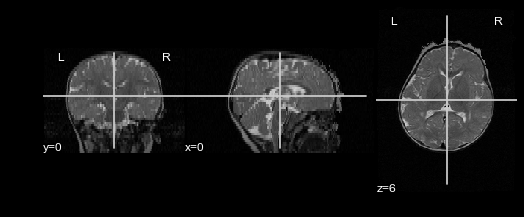

In [182]:
plotting.plot_anat( img, vmax=300 )

In [181]:
img.get_data().max()

273.34885

In [151]:
affine = img.affine
print affine

[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -52.5]
 [   0.     0.     0.     1. ]]


In [152]:
# print affine[0]

In [153]:
# now change header
# you could do this by hand for instance by:
# open with mango --> image info --> header --> edit --> fill it by hand, set s-form to 1 (by scanner), save

In [154]:
# img.header

In [155]:
print img.header

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  36   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [ 1.  1.  1.  3.  0.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : FSL5.0
aux_file        : 
qform_code      : unknown
sform_code      : unknown
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : 0.0
qoffset_y       : 0.0
qoffset_z       : 0.0
srow_x          : [ 0.  0.  0.  0.]
srow_y          : 

In [156]:
hdr = img.header

In [157]:
# hdr.get_sform()

In [158]:
hdr.set_sform( affine )

In [159]:
print img.header

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  36   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [ 1.  1.  1.  3.  0.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : FSL5.0
aux_file        : 
qform_code      : unknown
sform_code      : aligned
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : 0.0
qoffset_y       : 0.0
qoffset_z       : 0.0
srow_x          : [ -1.    0.    0.   95.5]
srow_y    

In [160]:
# another way to set the sform matrix, and here now to set sform_code to 1 (scanner)
raw = hdr.structarr

In [161]:
raw['sform_code'] = 1

In [162]:
print raw['sform_code']
print img.header

1
<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  36   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : float32
bitpix          : 32
slice_start     : 0
pixdim          : [ 1.  1.  1.  3.  0.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : FSL5.0
aux_file        : 
qform_code      : unknown
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : 0.0
qoffset_y       : 0.0
qoffset_z       : 0.0
srow_x          : [ -1.    0.    0.   95.5]
srow_y  

In [163]:
#raw['srow_x'] = [  -1. ,    0. ,    0. ,   95.5]
#raw['srow_x'] = affine[0]
#raw['srow_y'] = [   0. ,    1. ,    0. , -127.5]
#raw['srow_z'] = [   0. ,    0. ,    3. ,  -70.5]

In [164]:
#print raw['srow_x']
#print img.header

In [165]:
# save the file with the new header
nib.nifti1.save(img, '/Users/katja/NIHPD/antsTry/1460_V1/test1460_V1_f_nib.nii.gz')

In [170]:
%%bash
ls -al
echo "je t'aime mon amour de mon coeur" > love.txt
# give your work some love from time to time :D ;)

total 184
drwxr-xr-x   5 katja  staff    170 Mar 28 11:18 .
drwxr-xr-x  20 katja  staff    680 Mar 26 13:54 ..
drwxr-xr-x   4 katja  staff    136 Mar 27 16:47 .ipynb_checkpoints
-rw-r--r--   1 katja  staff   5713 Mar 21 21:11 test.ipynb
-rw-r--r--   1 katja  staff  83008 Mar 28 11:18 test_NIHPD.ipynb


In [171]:
%%bash
cat love.txt

je t'aime mon amour de mon coeur


In [172]:
%%bash
ls -hal

total 192
drwxr-xr-x   6 katja  staff   204B Mar 28 11:32 .
drwxr-xr-x  20 katja  staff   680B Mar 26 13:54 ..
drwxr-xr-x   4 katja  staff   136B Mar 27 16:47 .ipynb_checkpoints
-rw-r--r--   1 katja  staff    33B Mar 28 11:31 love.txt
-rw-r--r--   1 katja  staff   5.6K Mar 21 21:11 test.ipynb
-rw-r--r--   1 katja  staff    82K Mar 28 11:32 test_NIHPD.ipynb


# 3    Running ants to register T2w to T2w

%%bash
#try on the very tilted subject (rotation >90°) -- failed -- but try again later, I had an issue with the sform being set to aligned ÖÖ instead of scanner
data=/Users/katja/NIHPD/antsTry/
sub=1555_V1
template=/Users/katja/NIHPD/antsTry/1460_V1/test1460_V1_f_nib.nii.gz
t1brain=/Users/katja/NIHPD/antsTry/1555_V1/test1555_V1_f_nib.nii.gz
/Applications/ants/bin/antsRegistration \
    --dimensionality 3 \
    --float 1 \
    --output [$data/output6SyN_nib/1460template_to_${sub},$data/output6SyN_nib/1460template_to${sub}_Warped.nii.gz] \
    --interpolation Linear \
    --winsorize-image-intensities [0.005,0.995] \
    --use-histogram-matching 1 \
    --initial-moving-transform [$t1brain,$template,1] \
    --transform Rigid[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250x100,1e-6,10] \
    --shrink-factors 8x4x2x1 \
    --smoothing-sigmas 3x2x1x0vox \
    --transform Affine[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250x100,1e-6,10] \
    --shrink-factors 8x4x2x1 \
    --smoothing-sigmas 3x2x1x0vox \
    --transform SyN[0.1,3,0] \
    --metric CC[$t1brain,$template,1,4] \
    --convergence [100x70x50x20,1e-6,10] \
    --shrink-factors 8x4x2x1 \
    --smoothing-sigmas 3x2x1x0vox


%%bash
#keeping parameters for high level of going down to voxel size 
data=/Users/katja/NIHPD/antsTry/
sub=1555_V1
template=/Users/katja/NIHPD/antsTry/1437_V1/test1437_V1_f_nib.nii.gz
t1brain=/Users/katja/NIHPD/antsTry/1555_V1/test1555_V1_f_nib.nii.gz
/Applications/ants/bin/antsRegistration \
    --dimensionality 3 \
    --float 1 \
    --output [$data/output7SyN_nib/1437template_to_${sub},$data/output7SyN_nib/1437template_to${sub}_Warped.nii.gz] \
    --interpolation Linear \
    --winsorize-image-intensities [0.005,0.995] \
    --use-histogram-matching 1 \
    --initial-moving-transform [$t1brain,$template,1] \
    --transform Rigid[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250x100,1e-6,10] \
    --shrink-factors 8x4x2x1 \
    --smoothing-sigmas 3x2x1x0vox \
    --transform Affine[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250x100,1e-6,10] \
    --shrink-factors 8x4x2x1 \
    --smoothing-sigmas 3x2x1x0vox \
    --transform SyN[0.1,3,0] \
    --metric CC[$t1brain,$template,1,4] \
    --convergence [100x70x50x20,1e-6,10] \
    --shrink-factors 8x4x2x1 \
    --smoothing-sigmas 3x2x1x0vox



In [ ]:
%%bash
# with less precision here (not going down to the voxel level)
data=/Users/katja/NIHPD/antsTry/
sub=1555_V1
template=/Users/katja/NIHPD/antsTry/1437_V1/test1437_V1_f_nib.nii.gz
t1brain=/Users/katja/NIHPD/antsTry/1555_V1/test1555_V1_f_nib.nii.gz
/Applications/ants/bin/antsRegistration \
    --dimensionality 3 \
    --float 1 \
    --output [$data/output8SyN_nibLess/1437templateLess_to_${sub},$data/output8SyN_nibLess/1437templateLess_to${sub}_Warped.nii.gz] \
    --interpolation Linear \
    --winsorize-image-intensities [0.005,0.995] \
    --use-histogram-matching 1 \
    --initial-moving-transform [$t1brain,$template,1] \
    --transform Rigid[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform Affine[0.1] \
    --metric MI[$t1brain,$template,1,32,Regular,0.25] \
    --convergence [1000x500x250,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox \
    --transform SyN[0.1,3,0] \
    --metric CC[$t1brain,$template,1,4] \
    --convergence [100x70x50,1e-6,10] \
    --shrink-factors 8x4x2 \
    --smoothing-sigmas 3x2x1vox


# 4    set sform for segmentation files

In [221]:
%%bash
fslchfiletype NIFTI_GZ /Users/katja/NIHPD/antsTry/1437_V1/Cerebellum.nii.gz
fslchfiletype NIFTI_GZ /Users/katja/NIHPD/antsTry/1555_V1/1555_V1_Cerebellum.nii.gz

In [232]:
# mask = nib.load('/Users/katja/NIHPD/antsTry/1437_V1/Cerebellum.nii.gz')
mask = nib.load('/Users/katja/NIHPD/antsTry/1555_V1/1555_V1_Cerebellum.nii.gz')

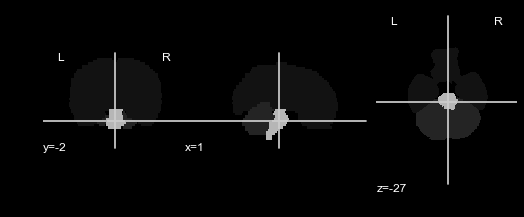

In [233]:
plotting.plot_anat( mask )

In [234]:
hdrM = mask.header
print hdrM

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  48   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : uint8
bitpix          : 8
slice_start     : 0
pixdim          : [ 1.  1.  1.  3.  1.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : FSL5.0
aux_file        : 
qform_code      : unknown
sform_code      : unknown
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : 0.0
qoffset_y       : 0.0
qoffset_z       : 0.0
srow_x          : [ 0.  0.  0.  0.]
srow_y          : [ 0

In [235]:
affineMask = mask.affine
print affineMask

[[  -1.     0.     0.    95.5]
 [   0.     1.     0.  -127.5]
 [   0.     0.     3.   -70.5]
 [   0.     0.     0.     1. ]]


In [236]:
hdrM.set_sform( affineMask )
print hdrM

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  48   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : uint8
bitpix          : 8
slice_start     : 0
pixdim          : [ 1.  1.  1.  3.  1.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : FSL5.0
aux_file        : 
qform_code      : unknown
sform_code      : aligned
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : 0.0
qoffset_y       : 0.0
qoffset_z       : 0.0
srow_x          : [ -1.    0.    0.   95.5]
srow_y       

In [237]:
rawMask = hdrM.structarr
print rawMask

(348, '', '', 0, 0, 'r', 0, [3, 192, 256, 48, 1, 1, 1, 1], 0.0, 0.0, 0.0, 0, 2, 8, 0, [1.0, 1.0, 1.0, 3.0, 1.0, 0.0, 0.0, 0.0], 0.0, nan, nan, 0, 0, 10, 0.0, 0.0, 0.0, 0.0, 0, 0, 'FSL5.0', '', 0, 2, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, [-1.0, 0.0, 0.0, 95.5], [0.0, 1.0, 0.0, -127.5], [0.0, 0.0, 3.0, -70.5], '', 'n+1')


In [238]:
rawMask['sform_code'] = 1

In [239]:
print mask.header

<class 'nibabel.nifti1.Nifti1Header'> object, endian='<'
sizeof_hdr      : 348
data_type       : 
db_name         : 
extents         : 0
session_error   : 0
regular         : r
dim_info        : 0
dim             : [  3 192 256  48   1   1   1   1]
intent_p1       : 0.0
intent_p2       : 0.0
intent_p3       : 0.0
intent_code     : none
datatype        : uint8
bitpix          : 8
slice_start     : 0
pixdim          : [ 1.  1.  1.  3.  1.  0.  0.  0.]
vox_offset      : 0.0
scl_slope       : nan
scl_inter       : nan
slice_end       : 0
slice_code      : unknown
xyzt_units      : 10
cal_max         : 0.0
cal_min         : 0.0
slice_duration  : 0.0
toffset         : 0.0
glmax           : 0
glmin           : 0
descrip         : FSL5.0
aux_file        : 
qform_code      : unknown
sform_code      : scanner
quatern_b       : 0.0
quatern_c       : 0.0
quatern_d       : 0.0
qoffset_x       : 0.0
qoffset_y       : 0.0
qoffset_z       : 0.0
srow_x          : [ -1.    0.    0.   95.5]
srow_y       

In [240]:
# save the segmentation with the new header
nib.nifti1.save( mask, '/Users/katja/NIHPD/antsTry/1555_V1/Cerebellum_nib.nii.gz' )

# 5    Running ants to register segmentation to T2w

%%bash
#test if it works to register the two anatomies by just applying the warp and affine -- yes it does :D 

/Applications/ants/bin/WarpImageMultiTransform \
3 \
/Users/katja/NIHPD/antsTry/1437_V1/test1437_V1_f_nib.nii.gz \
/Users/katja/NIHPD/antsTry/1555_V1/1555_V1_From1437.nii.gz \
-R /Users/katja/NIHPD/antsTry/1555_V1/test1555_V1_f_nib.nii.gz \
/Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V11Warp.nii.gz \
/Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V10GenericAffine.mat

In [243]:
%%bash
# register segmentation onto anatomy
# the mask is slightly to big dorsally :( but otherwise awesome :D 

/Applications/ants/bin/WarpImageMultiTransform 3 /Users/katja/NIHPD/antsTry/1437_V1/Cerebellum_nib.nii.gz /Users/katja/NIHPD/antsTry/1555_V1/1555_V1_CerebellumFrom1437.nii.gz -R /Users/katja/NIHPD/antsTry/1555_V1/test1555_V1_f_nib.nii.gz --use-NN /Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V11Warp.nii.gz /Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V10GenericAffine.mat




FIELD: /Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V11Warp.nii.gz
AFFINE: /Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V10GenericAffine.mat
moving_image_filename: /Users/katja/NIHPD/antsTry/1437_V1/Cerebellum_nib.nii.gz components 1
output_image_filename: /Users/katja/NIHPD/antsTry/1555_V1/1555_V1_CerebellumFrom1437.nii.gz
reference_image_filename: /Users/katja/NIHPD/antsTry/1555_V1/test1555_V1_f_nib.nii.gz
[0/2]: FIELD: /Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V11Warp.nii.gz
[1/2]: AFFINE: /Users/katja/NIHPD/antsTry/output8SyN_nibLess/1437templateLess_to_1555_V10GenericAffine.mat
User nearest neighbor interpolation (was Haha) 
  We check the syntax of your call .... 
 syntax probably ok. 
output origin: [-95.5, 127.5, -70.5]
output size: [192, 256, 48]
output spacing: [1, 1, 3]
output direction: 1 0 0
0 -1 0
0 0 1

